In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import imageio
from numba import njit
from ipywidgets import interact, interactive
from scipy.signal import convolve2d

plt.rcParams.update({"font.size" : 16, "font.family" : "serif", "figure.figsize" : (8,8)})

### Обработка

In [20]:
images = [plt.imread("images/IMG_0{}.jpeg".format(i))[600:3000,870:3250] for i in range(377, 475)]

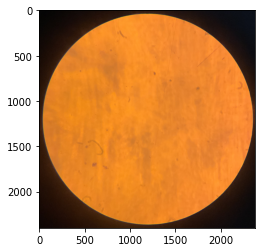

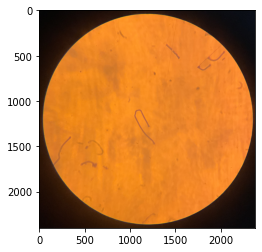

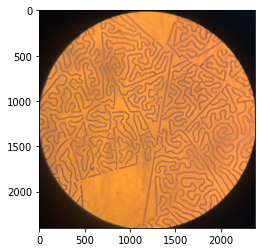

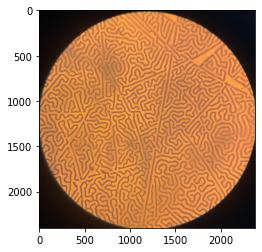

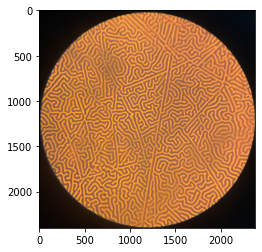

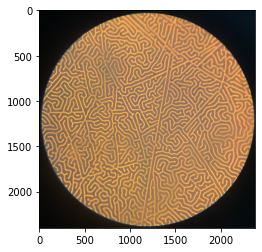

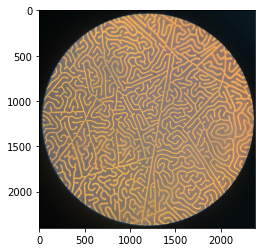

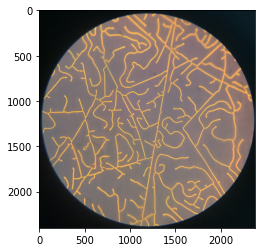

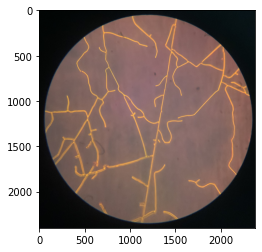

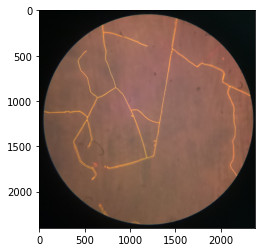

In [22]:
for img in images[::10]:
    plt.figure()
    plt.imshow(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


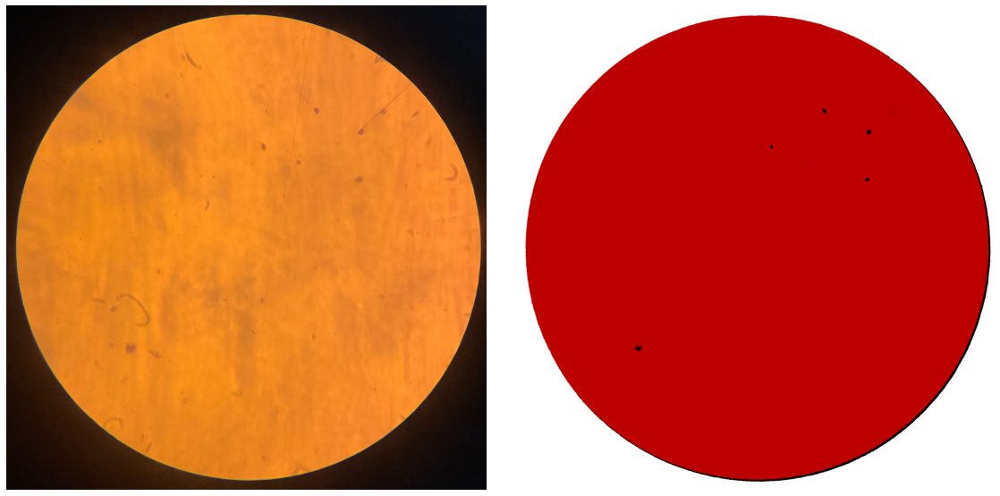

In [558]:
plt.figure(figsize=(16,8))
plt.subplot(121)
plt.imshow(images[7])
plt.axis("off")

plt.subplot(122)
test = images[7][::,::,0]/255
test_bw = cv2.threshold(test, maxval=1, thresh=190/255, type=cv2.THRESH_BINARY)[1]
temp = np.zeros(shape)
temp[::,::,0] = test_bw
plt.axis("off")
plt.imshow((temp/1.35+mask*255))

plt.tight_layout()

plt.savefig("res/bubbles.pdf", dpi=300)

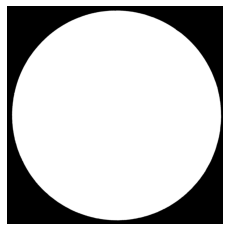

In [520]:
test = images[-3][::,::,0]/255
test_bw = cv2.threshold(test, maxval=1, thresh=80/255, type=cv2.THRESH_BINARY)[1]
temp = np.zeros(shape)
temp[::,::,0] = (test_bw)
temp[::,::,1] = (test_bw)
temp[::,::,2] = (test_bw)
plt.axis("off")
plt.imshow(temp)

mask = 1-temp

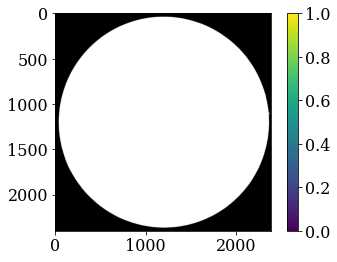

In [501]:
plt.imshow(mask[::,::,None]*np.ones(shape))
plt.colorbar()

In [280]:
for i in range(0, 96):
    test = 1-images[i][::,::,0]/255
    test_bw = cv2.threshold(test, maxval=1, thresh=190/255, type=cv2.THRESH_BINARY)[1]
    plt.figure(figsize=(12,12))
    plt.imshow(test_bw, cmap='binary')
    
    plt.axis('off')
    plt.savefig("images_bw/{}.jpeg".format(str("0" + str(i+1))[1:]), bbox_inches='tight')
    plt.close()

In [469]:
len(range(0, 96, 12))

8

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


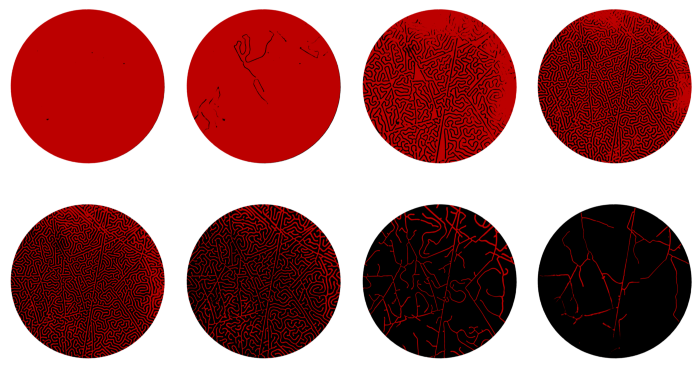

In [530]:
plt.figure(figsize=(10, 6))

for i in range(0, 96, 12):
    plt.subplot(2, 4, i//12 + 1)
    test = images[i][::,::,0]/255
    test_bw = cv2.threshold(test, maxval=1, thresh=190/255, type=cv2.THRESH_BINARY)[1]
    temp = np.zeros(shape)
    temp[::,::,0] = test_bw
    plt.axis("off")
    plt.imshow((temp/1.35+mask*255))
    
plt.tight_layout()
plt.savefig("res/mnogo.pdf", dpi=300)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


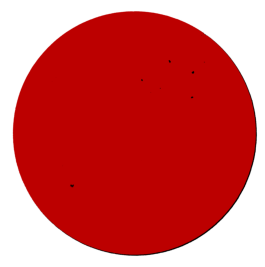

In [552]:

test = images[7][::,::,0]/255
test_bw = cv2.threshold(test, maxval=1, thresh=190/255, type=cv2.THRESH_BINARY)[1]
temp = np.zeros(shape)
temp[::,::,0] = test_bw
plt.axis("off")
plt.imshow((temp/1.35+mask*255))
    
plt.tight_layout()
# plt.savefig("res/mnogo.pdf", dpi=300)

In [ ]:
### shape = images[0].shape

test = images[48][::,::,0]/255
test_bw = cv2.threshold(test, maxval=1, thresh=190/255, type=cv2.THRESH_BINARY)[1]
temp = np.zeros(shape)
temp[::,::,0] = test_bw

plt.figure(figsize=(12,12))
plt.imshow(temp, cmap='binary')

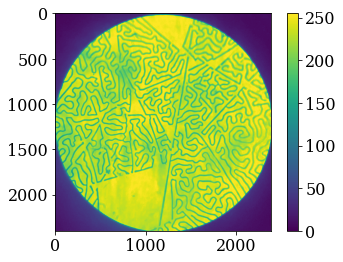

In [315]:


plt.imshow(images[20][::,::,0])
plt.colorbar()

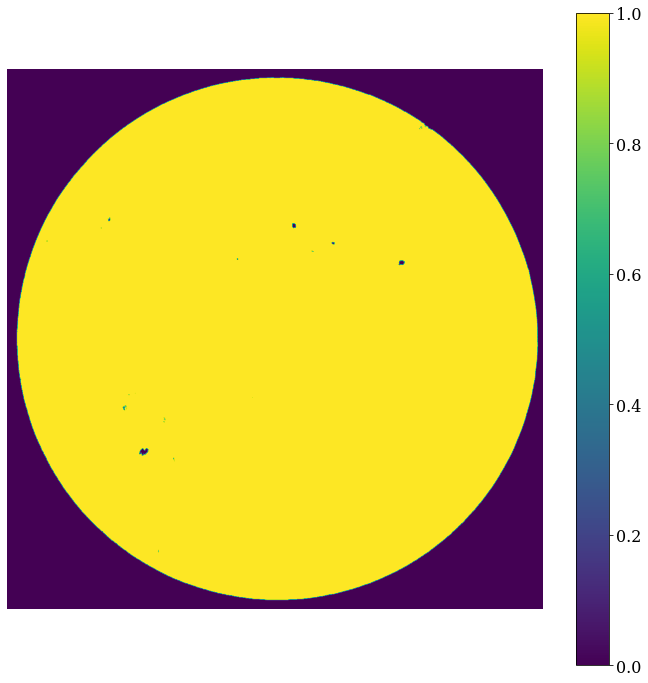

In [321]:
test = images[0][::,::,0]/255
test_bw = cv2.threshold(test, maxval=1, thresh=195/255, type=cv2.THRESH_BINARY)[1]
plt.figure(figsize=(12,12))
plt.imshow(test_bw)
plt.axis('off')
plt.savefig("images_bw/test.jpeg", bbox_inches='tight')

plt.colorbar()

In [354]:
current = np.array([-31, -28, -26, -24, -22, -20, -19, 
          -18, -17, -16.5, -16, -15.5, -15, -14.5, -14, 
          -13.5, -13, -12.5, -12, -11.5, -11, -10.5, -10, 
          -9.5, -9, -8.5, -8, -7.5, -7, -6.5, -6, 
          -5.5, -5, -4.5, -4, -3, -2, 0,
          0.5, 1, 1.5, 2, 2.5, 3, 4, 5, 5.5,
          6, 6.5, 7, 8, 8.5, 9.5, 10, 10.5, 11, 11.5,
          12, 12.5, 13, 13.5, 14, 14.5, 15, 15.5, 16, 
          16.5, 17, 17.5, 18, 18.5, 19, 19.5, 20, 
          21, 21.5, 22, 22.5, 23, 23.5, 24, 
          24.5, 25, 25.5, 26, 26.5, 27, 27.5, 
          28, 28.5, 29, 29.5, 30, 30.5, 31, 31.5])/100

widths = []
for i in range(0, 96):
    test = images[i][::,::, 0]/255
    test_bw = cv2.threshold(test, maxval=1, thresh=190/255, type=cv2.THRESH_BINARY)[1]
    widths.append(test_bw.sum())

test = images[0][::,::, 0]/255
test_bw = cv2.threshold(test, maxval=1, thresh=190/255, type=cv2.THRESH_BINARY)[1]
A = np.sum(test_bw)

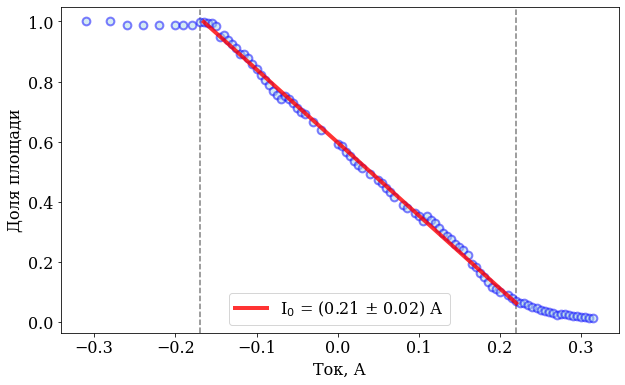

In [411]:
l, r = 9, 19
plt.figure(figsize=(10, 6))
plt.scatter(current, widths/A, s=60, 
            color="lightblue", 
            alpha=0.5, 
            edgecolors="blue", 
            linewidths=2)
plt.xlabel("Ток, А")
plt.ylabel("Доля площади")

k, b = np.polyfit(current[l:-r], widths[l:-r], deg=1)

plt.plot(current[l:-r], k/A*current[l:-r] + b/A, color="red", linewidth=4, alpha=0.8,
        label="I$_0$ = ({} ± 0.02) А".format(round(-1/ (2 * k/A),2)))
plt.axvline(-0.17, color="black", linestyle="--", zorder=-2, alpha=0.5)
plt.axvline(0.22, color="black", linestyle="--", zorder=-2, alpha=0.5)

plt.legend()
plt.savefig("res/area.pdf", dpi=300)

In [403]:
(22+17)/2 - 21

-1.5

In [296]:
frames = []
for j in range(1, 96+1):
    image = imageio.v2.imread("images_bw/{}.jpeg".format(j))
    frames.append(image)

In [297]:
imageio.mimsave('res/res.gif', # output gif
                frames,          # array of input frames
                fps = 10)         # optional: frames per second

In [199]:
test_bw[::,::,0]

array([[255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

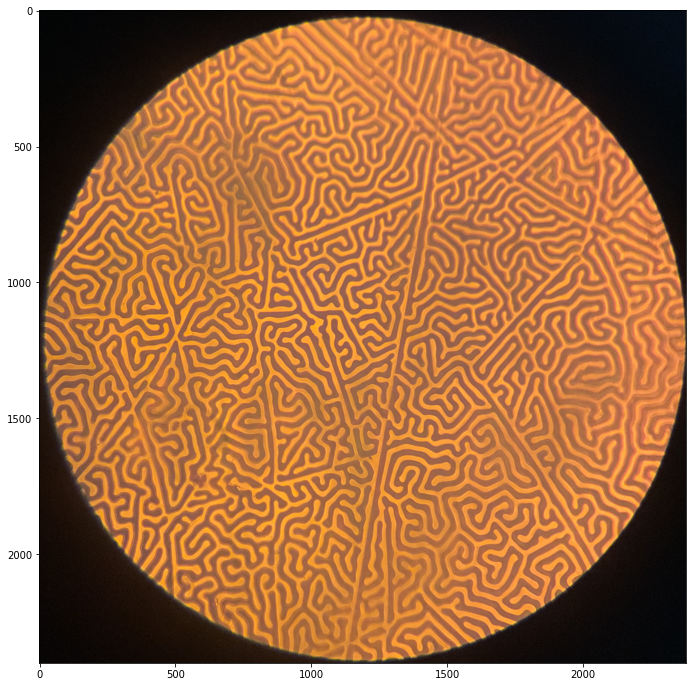

In [176]:
plt.figure(figsize=(12,12))
plt.imshow(images[40])

## Модель Изинга

### Метод отжига, Монте-Карло

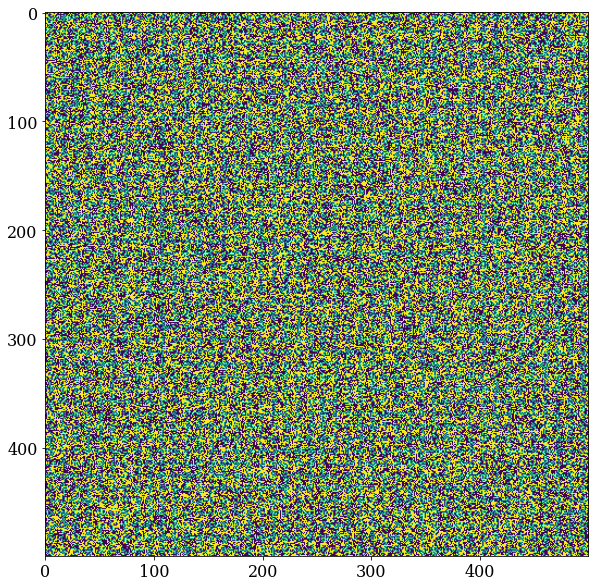

In [3]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1

plt.figure(figsize=(10,10))
plt.imshow(field)

In [4]:
@njit
def ising_energy(field, J=1):
    n = field.shape[0]
    
    energy = 0
    for i in range(n):
        for j in range(n):
            energy += -J*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])
    return energy



@njit
def ising_simulation(field, J=1, T=0.05, maxiter=int(1e8), step=int(1e6), eps=5e-4):
    #init
    n = field.shape[0]
    
    #to flip or not to flip
    rand_positions = np.random.randint(low=0, high=n, size=2*maxiter).reshape(-1, 2)
    rand_decision = np.random.random(maxiter)

    temp_E = ising_energy(field)
    #Ising steps, Monte-Carlo
    for idx in range(maxiter):
        i, j = rand_positions[idx]
        energy = -J*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])

        if energy > 0 or rand_decision[idx] < np.exp(2*energy/T):
            field[i, j] = -field[i, j]
    
        if (idx+1) % step == 0:
            temp_E2 = ising_energy(field)
            delta = np.abs(temp_E2 - temp_E)
            
            if delta < eps * np.abs(temp_E):
                break
            else:
                temp_E = temp_E2
                
    return field, np.abs(delta/temp_E), idx+1

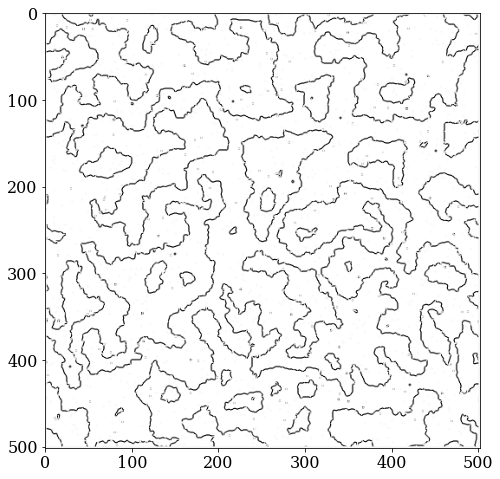

In [21]:
sobel_x = np.array([[1, 0, -1],
                   [2, 0, -2],
                  [1, 0, -1]])
sobel_y = sobel_x.T


field = ising_simulation(field, T=1.5, maxiter=int(1e6))[0]
plt.imshow(np.sqrt(convolve2d(field, sobel_x)**2+convolve2d(field, sobel_y)**2)**4, cmap='binary')

In [22]:
from skimage.measure import block_reduce

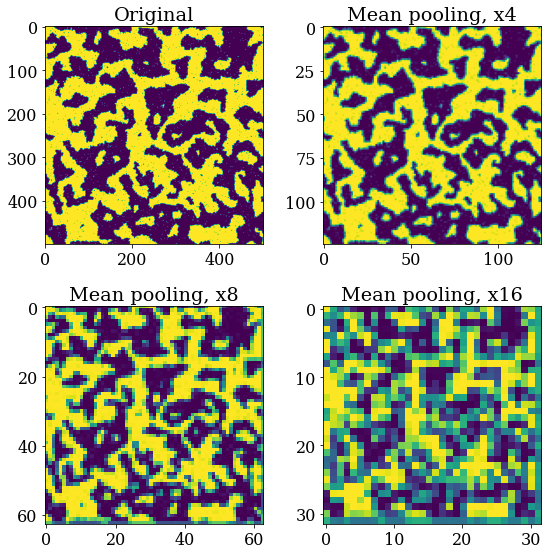

In [56]:
plt.figure(figsize=(8,8))

plt.subplot(221)
plt.title("Original")
plt.imshow(field)

plt.subplot(222)
plt.title("Mean pooling, x4")
plt.imshow(block_reduce(field, (4,4), np.mean))

plt.subplot(223)
plt.title("Mean pooling, x8")
plt.imshow(block_reduce(field, (8,8), np.mean))

plt.subplot(224)
plt.title("Mean pooling, x16")
plt.imshow(block_reduce(field, (16,16), np.mean))

plt.tight_layout()

_Анимация установления равновесия при случайной начальной решетке_

In [7]:
for idx in range(1, 500+1):
    plt.figure()
    plt.imshow(ising_simulation(field, T=0.01, J=2, N=int(1e5)))
    plt.axis('off')
    plt.tight_layout()
    
    plt.savefig("ising/frame{}.jpg".format(idx))
    plt.close()
    
    
frames = []
for idx in range(1, 501):
    image = imageio.v2.imread("ising/frame{}.jpg".format(idx))
    frames.append(image)
    
imageio.mimsave('res/ising.gif', # output gif
                frames,          # array of input frames
                fps = 20)         # optional: frames per second

TypeError: some keyword arguments unexpected

<Figure size 576x576 with 0 Axes>

### Фазовый переход II-рода. Разрыв теплоемкости

In [ ]:
temperatures = np.arange(0.1, 1.21, 0.01)
indices = [0]
deltas = [0]
energies = [ising_energy(field)]


for k, temp in zip(range(1, len(temperatures)+1), temperatures):
    field, delta, idx = ising_simulation(field, T=temp)
    energies.append(ising_energy(field))
    deltas.append(delta)
    indices.append(idx)
    
    plt.figure(figsize=(9,9))
    plt.imshow(field)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig("ising_tot/lattice/frame{}.jpg".format(k), dpi=150)
    plt.close()
    
    
    plt.figure(figsize=(9,9))
    plt.plot(temperatures[:len(energies)], energies)
    plt.xlabel("T, a.u.")
    plt.ylabel("E, a.u.")
    plt.xlim(0.0, 1.25)
    plt.ylim(-250000, -50000)
    plt.scatter(temperatures[len(energies)-1], energies[-1], color='red', 
                zorder=2, s=50)
    plt.title("Энергия")
    plt.tight_layout()
    plt.savefig("ising_tot/energy/frame{}.jpg".format(k), dpi=150)
    plt.close()

    
    
    plt.figure(figsize=(9,9))
    plt.plot(temperatures[:len(energies)], np.gradient(energies, 0.01))
    plt.scatter(temperatures[len(np.gradient(energies, 0.01))-1], np.gradient(energies, 0.01)[-1], color='red', 
                zorder=2, s=50)
    plt.xlabel("T, a.u.")
    plt.ylabel("$C_V$, a.u.")
    plt.title("Теплоемкость")
    plt.xlim(0.0, 1.25)
    plt.ylim(0.0, 800000)
    plt.tight_layout()
    plt.savefig("ising_tot/capacity/frame{}.jpg".format(k), dpi=150)
    plt.close()

In [ ]:
frames = []

for idx in range(1, 111):
    imgE = imageio.v2.imread("ising_tot/energy/frame{}.jpg".format(idx))
    imgC = imageio.v2.imread("ising_tot/capacity/frame{}.jpg".format(idx))
    imgL = imageio.v2.imread("ising_tot/lattice/frame{}.jpg".format(idx))
    
    img = np.hstack((imgE, imgC, imgL))
    frames.append(img)
    
imageio.mimsave('res/ising_tot.gif',
               frames,
               fps=10)

In [ ]:
plt.figure(figsize=(12,5))

plt.subplot(121)
plt.plot(temperatures, energies)
plt.xlabel("T, a.u.")
plt.ylabel("E, a.u.")
plt.title("Энергия")


plt.subplot(122)
plt.plot(temperatures, np.gradient(energies, 0.02))

cidx = np.argmax(np.gradient(energies, 0.02))
plt.scatter(temperatures[cidx], np.gradient(energies, 0.02)[cidx], color='red', 
            zorder=2, s=50, label="$T_C = {}$".format(round(temperatures[cidx],2)))
plt.xlabel("T, a.u.")
plt.ylabel("$C_V$, a.u.")
plt.title("Теплоемкость")

plt.legend()


plt.tight_layout()

plt.savefig("res/cv.jpg", dpi=200)

### Модель Изинга с учетом диагональных соседей, 8 соседей

In [3]:
@njit
def ising_energy_2(field, J=1):
    n = field.shape[0]
    
    energy = 0
    for i in range(n):
        for j in range(n):
            energy += -J/4*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j] +
                                    field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n])
    return energy




@njit
def ising_simulation_2(field, J=1, T=0.05, maxiter=int(1e8), step=int(1e6)):
    #init
    n = field.shape[0]
    
    #to flip or not to flip
    rand_positions = np.random.randint(low=0, high=n, size=2*maxiter).reshape(-1, 2)
    rand_decision = np.random.random(maxiter)

    temp_E = ising_energy_2(field, J)
    #Ising steps, Monte-Carlo
    for idx in range(maxiter):
        i, j = rand_positions[idx]
        energy = -J/4*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j] +
                                    field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n])

        if energy > 0 or rand_decision[idx] < np.exp(2*energy/T):
            field[i, j] = -field[i, j]
    
        if (idx+1) % step == 0:
            temp_E2 = ising_energy_2(field, J)
            delta = np.abs(temp_E2 - temp_E)
            
            if delta < 1e-4 * np.abs(temp_E):
                break
            else:
                temp_E = temp_E2
                
    return field, np.abs(delta/temp_E), idx+1

_Анимация для энергии, теплоемкости и самой решётки_

In [ ]:
plt.figure(figsize=(12,6))

plt.subplot(131)
plt.plot(temperatures, energies)
plt.xlabel("T, a.u.")
plt.ylabel("E, a.u.")
plt.title("Энергия")


plt.subplot(132)
plt.plot(temperatures, np.gradient(energies, 0.02))

cidx = np.argmax(np.gradient(energies, 0.02))
plt.scatter(temperatures[cidx], np.gradient(energies, 0.02)[cidx], color='red', 
            zorder=2, s=50, label="$T_C = {}$".format(round(temperatures[cidx],2)))
plt.xlabel("T, a.u.")
plt.ylabel("$C_V$, a.u.")
plt.title("Теплоемкость")

plt.legend()


plt.subplot(133)
plt.imshow(field)


plt.tight_layout()

# plt.savefig("res/cv.jpg", dpi=200)

_Инициализация_

In [ ]:
field, eps, idx = ising_simulation(field, T=0.1)
print(eps, idx/1e8)

In [ ]:
plt.imshow(field)

_Расчет для диапазона температур_

In [ ]:
temperatures = np.arange(0.1, 2.02, 0.02)
energies = []

for k, t in zip(range(57, 57+len(temperatures)), temperatures):
#     plt.figure(figsize=(8,8))
    
    field, delta, idx = ising_simulation_2(field, T=t)
    energies.append(ising_energy_2(field))
    
    plt.imshow(field)
    plt.title("T = {}".format(round(t, 2)))
    
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("ising2/frame{}.jpg".format(k), dpi=150)
    plt.close()

In [ ]:
frames = []

for k in range(1, 97):
    img = imageio.v2.imread("ising2/frame{}.jpg".format(k))
    frames.append(img)
    
imageio.mimsave("res/ising2.gif", frames, fps=10)

_Свертка для хорошей жизни_

In [ ]:
param = 4
kernel = np.ones(param)/param
energies_conv = np.convolve(energies, kernel, mode="same")

_Температур Кюри для диагональной модели увеличивается примерно вдвое_

In [ ]:
plt.figure(figsize=(12,6))

a, b = 3, -3

plt.subplot(121)
plt.plot(temperatures[a:b], energies_conv[a:b])


plt.subplot(122)
plt.plot(temperatures[a:b], np.gradient(energies_conv[a:b], 0.02))
cidx = np.argmax(np.gradient(energies_conv[a:b], 0.02))
plt.scatter(temperatures[a:b][cidx],  np.gradient(energies_conv[a:b], 0.02)[cidx], 
            color="red", s=60, zorder=2, label="$T_C = {}$".format(round(temperatures[cidx],2)))
plt.legend()

plt.tight_layout()

### Разрушение намагниченности

In [ ]:
n = 500
field = np.ones((n,n))

plt.figure(figsize=(10,10))
plt.imshow(field, vmin=-1, vmax=1)
plt.colorbar()

In [8]:
M = []

temperatures = np.arange(0.2, 1.01, 0.01)
    
for k, t in zip(range(1, len(temperatures)+1), temperatures):
    field, eps, idx = ising_simulation(field, T=t)
    m = np.sum(field)
    M.append(m)
    
    plt.figure(figsize=(16,8))
    plt.subplot(121)
    plt.imshow(field, vmin=-1, vmax=1, cmap='magma')
    plt.title("$T = {}$".format(round(t, 2)))
    plt.xticks([])
    plt.yticks([])
    
    
    
    plt.subplot(122)
    plt.fill_between(temperatures[:len(M)],0, np.array(M)/n**2, alpha=0.8, color='lightblue')
    plt.plot(temperatures[:len(M)], np.array(M)/n**2, color='red', linewidth=3)
    plt.scatter(temperatures[len(M)-1], M[-1]/n**2, color='red', s=100)
    plt.xlabel('T, a.u.')
    plt.ylabel('$M/M_{max}$')
    plt.xlim(0.2, 1.0)
    plt.ylim(0.0, 1.1)
    
    plt.tight_layout()
    
    
    plt.savefig("magnet_tot/frame{}.jpg".format(k), dpi=200)
    plt.close()

SystemError: CPUDispatcher(<function ising_simulation at 0x7ff141a2b130>) returned a result with an exception set

In [ ]:
frames = []

for i in range(1, 81):
    img = imageio.v2.imread("magnet_tot/frame{}.jpg".format(i))
    frames.append(img)
    
imageio.mimsave("res/magnet_tot.gif", frames, fps=10)

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(temperatures/0.6, M/np.max(M), color="lightblue", alpha=0.5, edgecolors='blue', s=80, linewidths=3)
plt.xlabel("$T/T_C$")
plt.ylabel("$M/M_{max}$")
plt.title("Намагниченность")

plt.axvline(1, color="red", linestyle='--')
plt.tight_layout()
plt.savefig('res/M.pdf', dpi=150)

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(temperatures[1:]/0.6, np.gradient(np.convolve(M/np.max(M), [1/2,1/2], mode='same')[1:], 0.02),
           color="lightblue", edgecolors='blue', s=80, linewidths=3, alpha=0.5, zorder=2)

plt.plot(temperatures[1:]/0.6, np.gradient(np.convolve(M/np.max(M), [1/2,1/2], mode='same')[1:], 0.02),
           color="red" ,alpha=0.5, zorder=-2)

plt.xlabel("$T/T_C$")
plt.ylabel("$\\frac{d}{dT}\\left(M/M_{max}\\right)$")
plt.axvline(1, color="red", linestyle='--')

plt.tight_layout()

plt.savefig("res/dM.pdf", dpi=100)

### Большой Изинг 2000х2000

In [ ]:
n = 2000
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1

plt.figure(figsize=(10,10))
plt.imshow(field)

In [ ]:
field, eps, idx = ising_simulation(field, T=0.001, step=int(5e8))
print(eps, idx/1e8)

In [ ]:
plt.imshow(field)
plt.axis('off')
plt.tight_layout()
plt.savefig("res/big_ising.pdf", dpi=400)

### Автокорреляционная функция

In [300]:
from scipy.signal import correlate2d

In [324]:
def vis_ac(res):
    return np.vstack((np.hstack((res[n//2:, n//2:], res[n//2:, :n//2])), np.hstack((res[:n//2, n//2:], res[:n//2, :n//2]))))

Text(0.5, 1.0, 'Автокорреляционная функция шума')

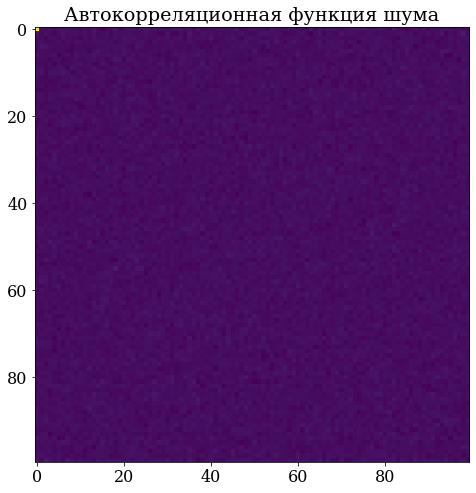

In [315]:
a = np.random.random((100, 100))
temp = np.fft.fft2(a)
autocorr = np.real(np.fft.ifft2(temp * np.conjugate(temp)))
vis_ac(autocorr)
plt.title("Автокорреляционная функция шума")

In [ ]:
res = np.zeros(39)

for _ in range(20):
    a = np.random.random((20, 20))
    res += np.mean(correlate2d(a, a), axis=0)

plt.plot(res)
plt.title("Автокорреляционная функция шума")

In [321]:
results = []

for _ in range(20):  
    n = 500
    field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1
    field, eps, idx = ising_simulation(field, maxiter=int(1e8), step=int(2e6))
    
    temp = np.fft.fft2(field)
    autocorr = np.fft.ifft2(temp * np.conjugate(temp))
    results.append(autocorr)

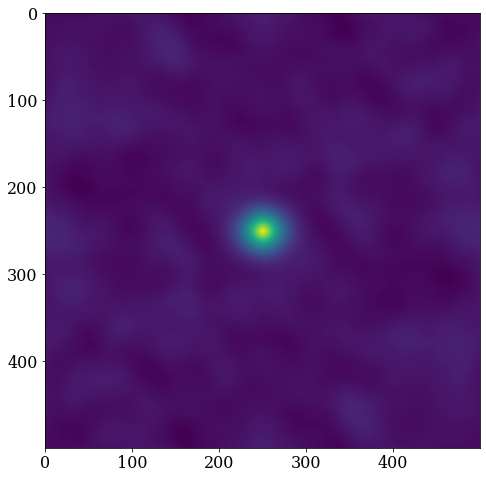

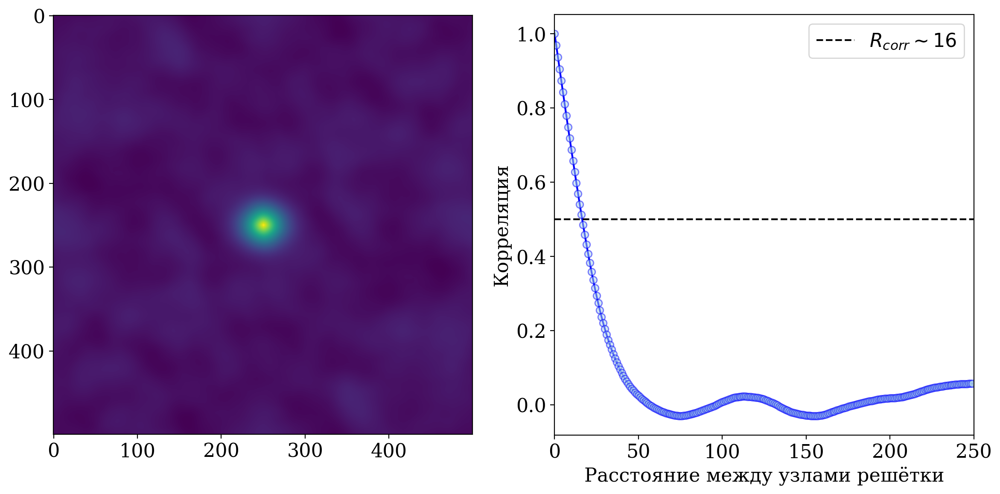

In [498]:
plt.figure(figsize=(12,6), dpi=200)
plt.subplot(121)
plt.imshow(vis_ac(np.real(np.mean(results,axis=0)))/np.max(vis_ac(np.real(np.mean(results,axis=0)))))


plt.subplot(122)
k = np.arange(0, 250, 1)
rtemp = vis_ac(np.real(np.mean(results,axis=0)))[n//2,n//2:].copy()
rtemp/= np.max(rtemp)
plt.plot(k,rtemp, color='blue')
plt.scatter(k,rtemp, color='lightblue', zorder=2, alpha=0.5, edgecolors='blue')
plt.axhline(0.5, linestyle="--", color="black", label='$R_{corr}\sim 16$')
plt.xlim(0.0,250)
plt.xlabel("Расстояние между узлами решётки")
plt.ylabel("Корреляция")
plt.legend()

plt.tight_layout()
# 
plt.savefig("res/autocorr.pdf", dpi=200)

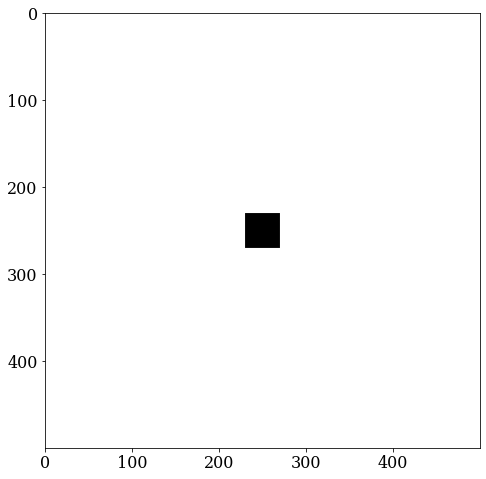

In [410]:
a = np.zeros((500,500))
b = np.zeros((500, 500))
b[n//2-20:n//2+20, n//2-20:n//2+20] = 1
plt.imshow(b, cmap='binary')

In [418]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1
field, eps, idx = ising_simulation(field, maxiter=int(1e8), step=int(2e6))

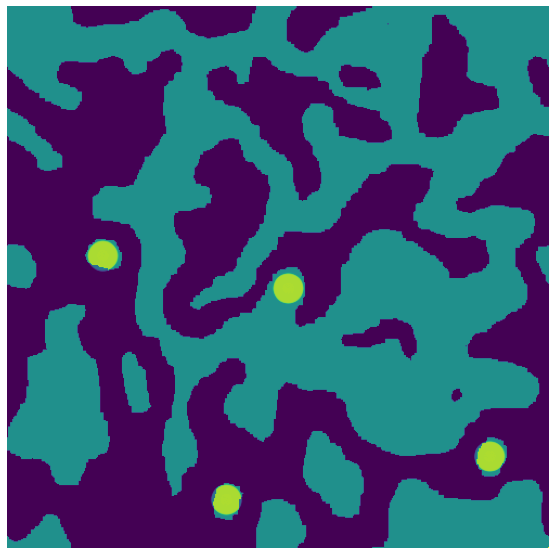

In [495]:
plt.imshow(field + 1.5*mask(xv-9, yv-10, 10) + 1.5*mask(xv+48, yv-205, 10) + 1.5*mask(xv+162, yv+20, 10) + 1.5*mask(xv-195, yv-165, 10) + 2*mask(xv-249, yv-249, 0.5))
plt.axis('off')
plt.tight_layout()
plt.savefig("res/radius.pdf", dpi=200, bbox_inches='tight')

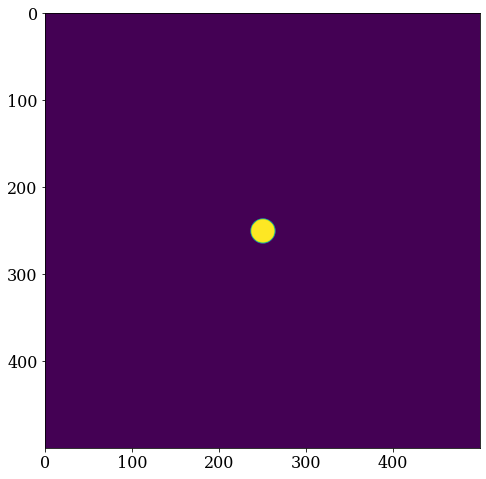

In [451]:
x = np.arange(0, 500)
y = np.arange(0, 500)
xv, yv = np.meshgrid(x, y)

def mask(x, y, s):
    return np.exp(-(((x-n//2)**2+(y-n//2)**2)/(2 * s**2))**20)

plt.imshow(mask(xv, yv, 10))

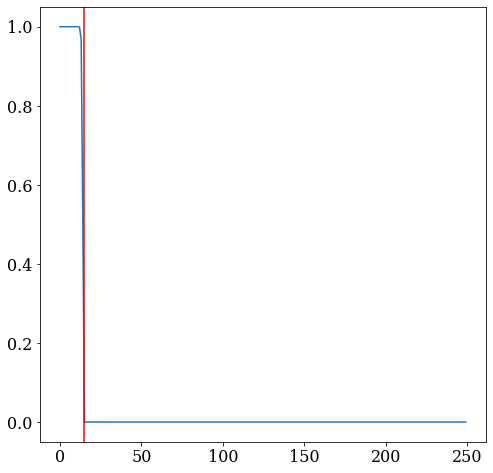

In [454]:
plt.plot(mask(xv, yv, 10)[n//2,n//2:])
plt.axvline(15, color="red")

In [ ]:
res_weird = np.vstack((np.hstack((res[n//2:, n//2:], res[n//2:, :n//2])), np.hstack((res[:n//2, n//2:], res[:n//2, :n//2]))))
# plt.imshow(np.hstack((res[n//2:, n//2:], res[n//2:, :n//2])))
# plt.imshow()
ac = res_weird[n//2,::][n//2:]

In [ ]:
plt.plot(autocorr[::,n//2])
plt.plot(autocorr[n//2,::])
plt.plot((autocorr[n//2,::] + autocorr[::,n//2])/2)

In [ ]:
for r in results:
    plt.plot(np.mean(r, axis=0)[:n//2])

### Изинг с дефектами в кристаллической решетке

_Линейный дефект - выбрасываем полоску атомов_

In [ ]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1

def_width = 50

field[n//2-def_width:n//2+def_width, n//2] = 0

plt.imshow(field)

In [ ]:
field, eps, idx = ising_simulation_defect(field, T=0.1)
plt.imshow(field)

In [ ]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1

def_width = 50

field[n//2-def_width:n//2+def_width, n//2-def_width:n//2+def_width] = 0

plt.imshow(field)

In [ ]:
field, eps, idx = ising_simulation_defect(field, T=0.1)
plt.imshow(field)

### Honeycomb lattice (почти)

_Элементарная ячейка_

In [ ]:
cell2 = np.array([[1.0,0.0],[1.0,0.0],[0.0, 1.0],[0.0, 1.0]])
cell4 = np.array([[1.0,0.0],[1.0,0.0],[1.0,0.0],[1.0, 0.0],[0.0, 1.0],[0.0, 1.0],[0.0, 1.0],[0.0, 1.0]])
plt.figure(figsize=(2,3))
plt.imshow(cell2, cmap='binary')

_Маска для моделирования пчелиной решётки = другая топология в модели Изинга_

In [ ]:
mask2 = np.vstack([np.hstack([cell2 for i in range(250)]) for i in range(250)])[:n, :n]
mask4 = np.vstack([np.hstack([cell4 for i in range(250)]) for i in range(125)])[:n, :n]

plt.imshow(mask[:20,:20], cmap='binary')
mask = np.array(mask2)

In [ ]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1
field = field*mask
field.shape

In [ ]:
plt.imshow(field, cmap='binary')

_Для удобста визуализации ячейки "вдвигаются в друг друга", чтобы не было видно промежутков между атомами_

In [ ]:
field, eps, idx = ising_simulation_2(field, T=0.01)
(eps, idx)
res = field[::,1:] + field[::,:-1]

plt.imshow(res, cmap='binary')
plt.axis('off')
plt.tight_layout()

E_ch = 10000
ising_energy_2(field)

In [ ]:
temperatures = np.append(np.arange(0.01, 0.8, 0.01), np.arange(0.8,0.0, -0.01))
energies = []

for k, t in zip(range(1, len(temperatures)+1),temperatures):
    field, eps, idx = ising_simulation_2(field, T=t)
    res = field[::,1:] + field[::,:-1]
    energies.append((ising_energy_2(field)+87000.0)/E_ch)
    
    
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.imshow(res, cmap='binary')
    plt.title("T = {}".format(round(t, 2)))
    plt.axis('off')
    
    plt.subplot(122)
    plt.plot(temperatures[:len(energies)], energies, color="blue", linewidth=3)
    plt.scatter(temperatures[len(energies)-1], energies[-1], color="red", s=100, zorder=2)
    plt.xlabel("T, a.u.")
    plt.ylabel("E, a.u.")
    plt.xlim(0.0, 0.8)
    plt.ylim(-2, 12)
    plt.tight_layout()
    
    plt.savefig("honeycomb/frame{}.jpg".format(k), dpi=200)

In [ ]:
frames = []

for i in range(1, 160):
    img = imageio.v2.imread("honeycomb/frame{}.jpg".format(i))
    frames.append(img)
    
imageio.mimsave("res/honeycomb.gif", frames, fps=15)

In [ ]:
size = len(energies)

plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(temperatures[size//2:], energies[size//2:],
        color='blue', linewidth=3)
plt.plot()
plt.xlabel("T, a.u.")
plt.ylabel("E, a.u.")
plt.title("Энергия")

plt.subplot(122)
plt.plot(temperatures[size//2::2], 
         np.gradient(energies[size//2::2],0.02),
        color='blue', linewidth=3)
plt.xlabel("T, a.u.")
plt.ylabel("E, a.u.")
plt.title("Теплоёмкость")

plt.tight_layout()

plt.savefig("res/honeycomb_transition.pdf", dpi=200)

### Красивая анимация

In [ ]:
n = 500
field = 2*np.random.random((n, n))-1
plt.imshow(field, cmap='binary')

In [ ]:
plt.rcParams.update({'figure.dpi' : 150})

In [ ]:
images = [plt.imread("honeycomb/frame{}.jpg".format(k)) for k in range(1, 160)]

In [ ]:
def frame(k):
    plt.imshow(images[k])
    plt.axis('off')

In [ ]:
interact(frame, k=(1, 159, 1))

### Антиферромагнетик, J<0

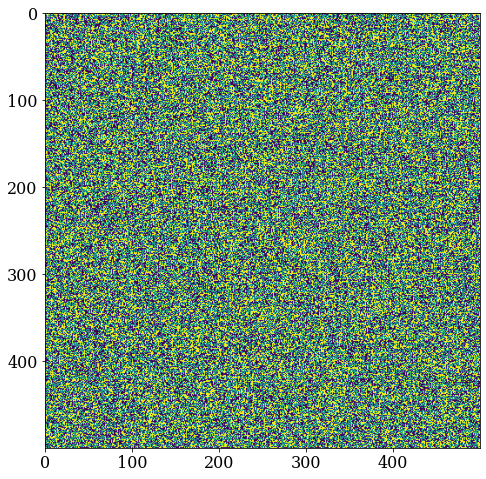

In [276]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1

plt.imshow(field)

0.0004331600693056111 1000000


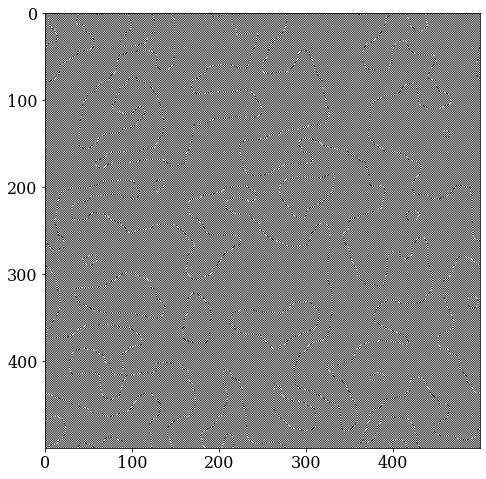

In [278]:
field, eps, idx = ising_simulation(field, J=-1, T=0.2)
print(eps, idx)


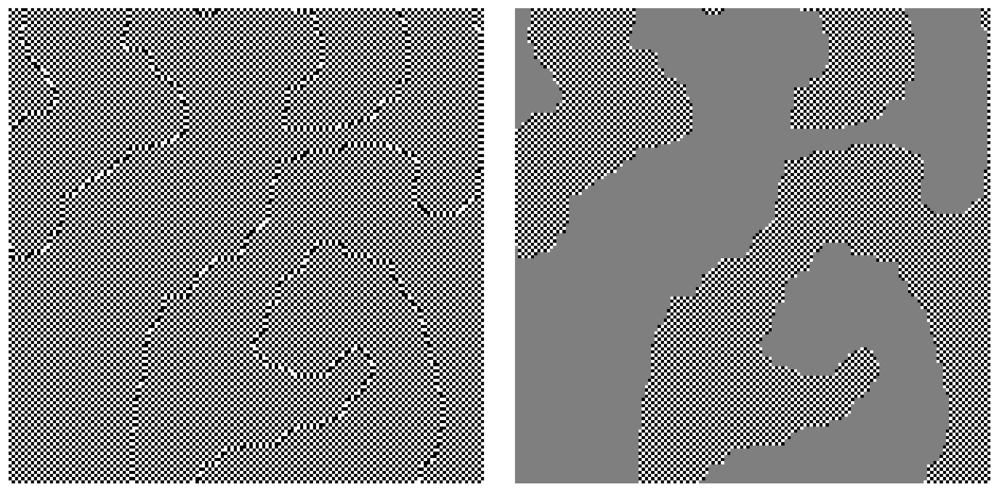

In [292]:
plt.figure(figsize=(12,6),dpi=200)
plt.subplot(121)
plt.imshow(field[:150,:150], cmap='binary')
plt.axis('off')


plt.subplot(122)
plt.imshow((field+mask)[:150,:150], cmap='binary')
plt.axis('off')

plt.tight_layout()

plt.savefig("res/anti_res.pdf", dpi=200)

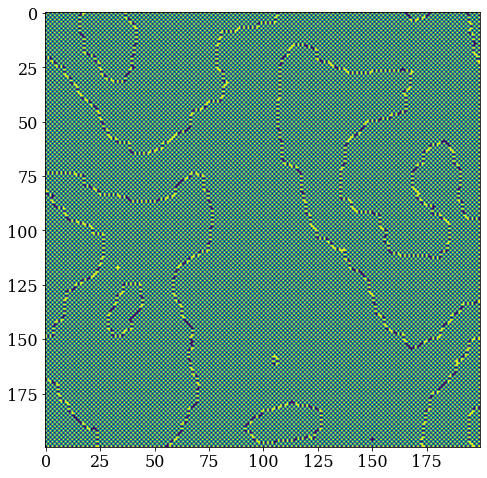

In [505]:
d = 100
field_tiny = field[n//2-d:n//2+d, n//2-d:n//2+d]
plt.imshow((field_tiny+1)**2)

__Выделение границ__

_Sobel filter_

In [682]:
from scipy.signal import convolve2d

sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_y = sobel_x.T

def sobel_det(field):
    temp = convolve2d(convolve2d(field, sobel_x), sobel_y)
    temp -= np.min(temp)
    temp = temp / np.max(temp)
    return temp - 0.5

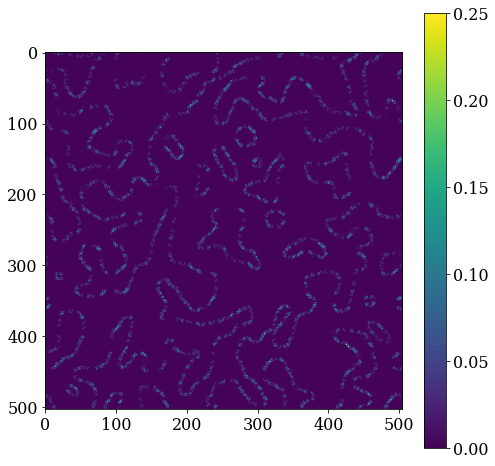

In [53]:
plt.imshow((sobel_det(field))**2)
plt.colorbar()

_Periodic mask_

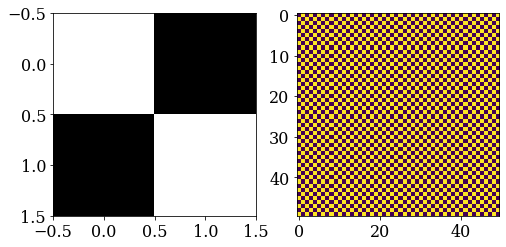

In [530]:
cell = np.array([[-1, 1], [1, -1]])
mask = np.vstack([np.hstack([cell for i in range(250)]) for i in range(250)])[:n, :n]
    

plt.subplot(121)
plt.imshow(cell, cmap='binary')

plt.subplot(122)
plt.imshow(mask[n//2-25:n//2+25, n//2-25:n//2+25])

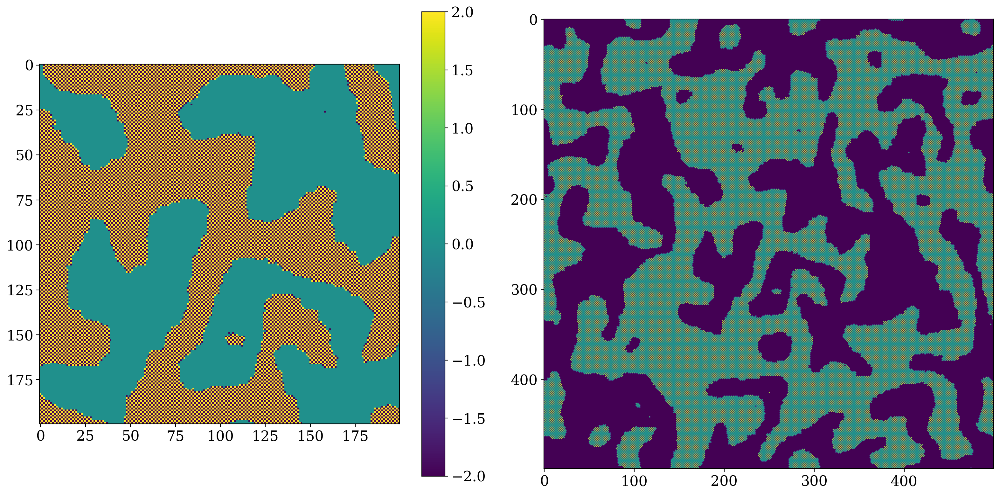

In [228]:
d = 100

plt.figure(figsize=(16,8), dpi=200)
plt.subplot(121)
plt.imshow((field+mask)[n//2-d:n//2+d, n//2-d:n//2+d])
plt.colorbar()

plt.subplot(122)
plt.imshow((field+mask + 1)**2)

plt.tight_layout()

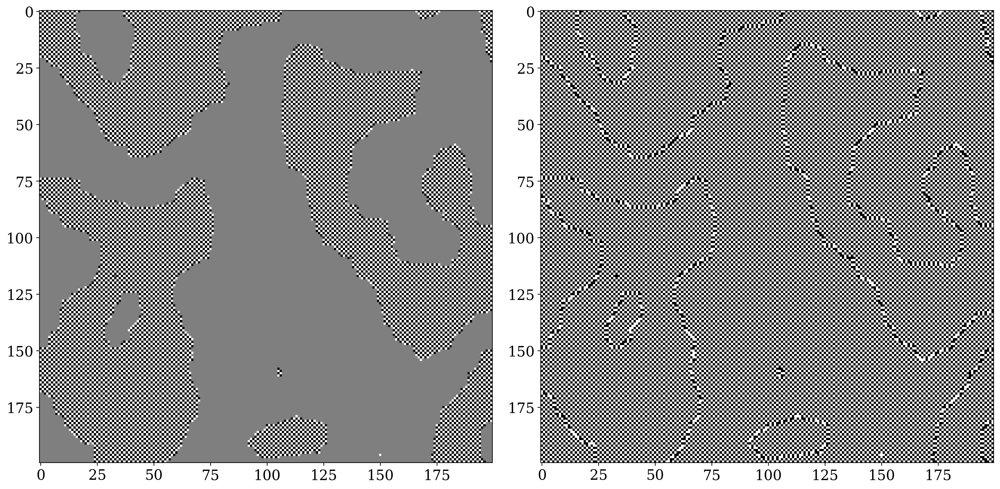

In [506]:
d = 100

plt.figure(figsize=(16,8), dpi=200)
plt.subplot(121)
plt.imshow((field+mask)[n//2-d:n//2+d, n//2-d:n//2+d], cmap='binary')

plt.subplot(122)
plt.imshow((field)[n//2-d:n//2+d, n//2-d:n//2+d], cmap='binary')


plt.tight_layout()

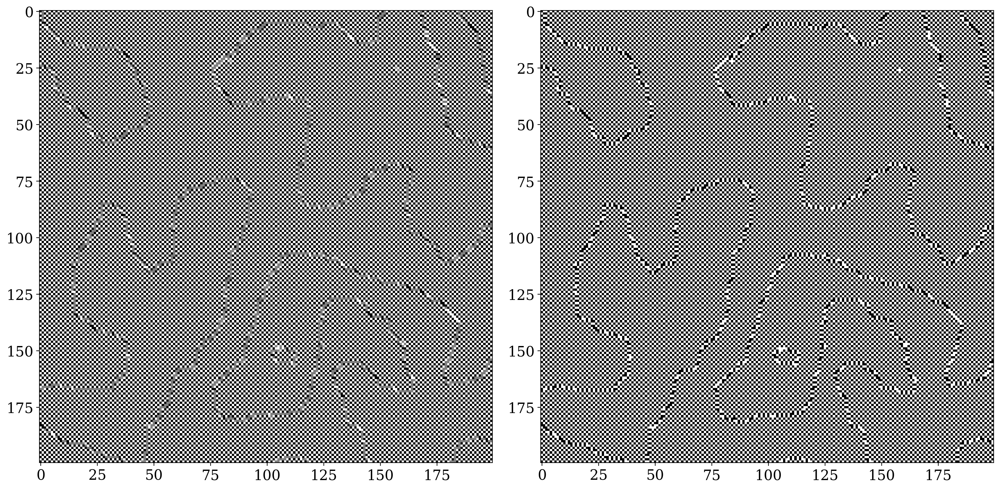

In [235]:
d = 100

plt.figure(figsize=(16,8), dpi=200)
plt.subplot(121)
plt.imshow((field[1:,1:] + field[:-1, :-1])[n//2-d:n//2+d, n//2-d:n//2+d], cmap='binary')

plt.subplot(122)
plt.imshow((field)[n//2-d:n//2+d, n//2-d:n//2+d], cmap='binary')


plt.tight_layout()

In [97]:
def anti_det(field):
    return (field + mask + 1)**2

_Ещё важно строить изображение с высоким разрешением, иначе возникает алаисинг_

Text(0.5, 1.0, 'Алаисинга нет, высокое разрешение')

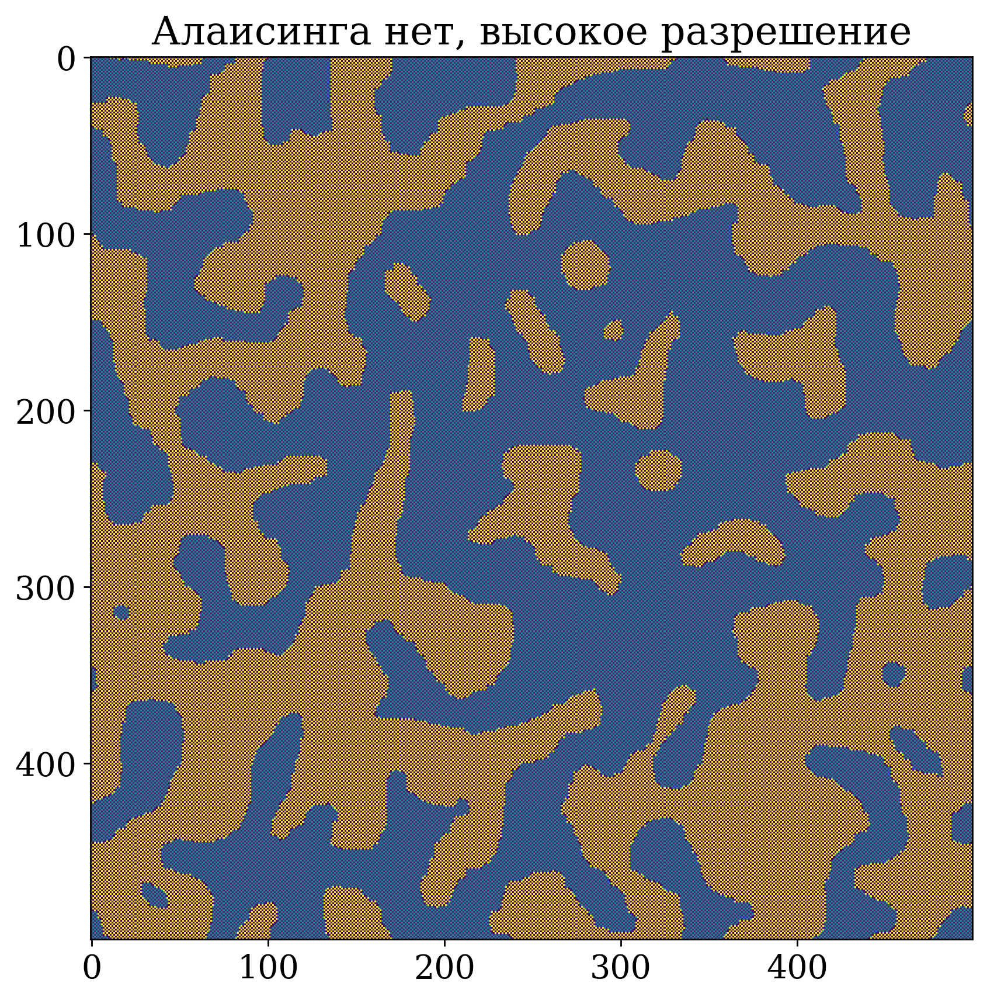

In [134]:
plt.figure(dpi=250)
plt.imshow(anti_det(field))
plt.title("Алаисинга нет, высокое разрешение")

Text(0.5, 1.0, 'Внутри доменов кто-то есть')

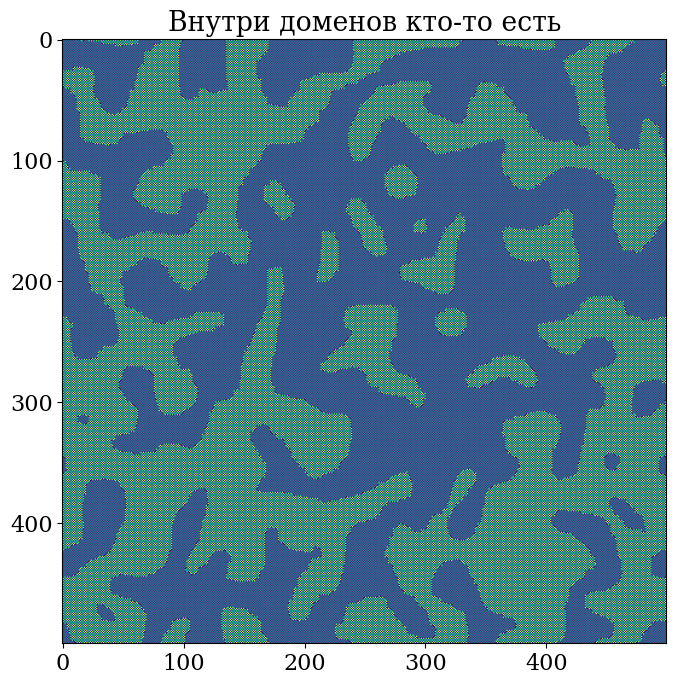

In [111]:
plt.figure(dpi=100)
plt.imshow(anti_det(field))
plt.title("Внутри доменов кто-то есть")

In [236]:
temperatures = np.arange(0.8, 0.00, -0.01)

for k, t in zip(range(1, len(temperatures)+1), temperatures):
    field, eps, idx = ising_simulation(field, J=-1, T=t)
    
    plt.figure(figsize=(14,7), dpi=250)
    plt.subplot(121)
    plt.imshow(field, cmap='binary')
    plt.axis('off')
    plt.title("Antiferromagnetic, T = {}".format(round(t,2)))

    plt.subplot(122)
    plt.imshow(field + mask, cmap='binary')
    plt.axis('off')
    plt.title("Domains, +chess mask")

    plt.tight_layout()
    
    plt.savefig('anti/frame{}.jpg'.format(k), dpi=250, bbox_inches='tight')
    plt.close()

In [237]:
frames = []

for k in range(1, 81):
    img = imageio.v2.imread("anti/frame{}.jpg".format(k))
    frames.append(img)
    
imageio.mimsave("res/anti.gif", frames, fps=10)

__Антиферромагнетик с диагональными соседями!__

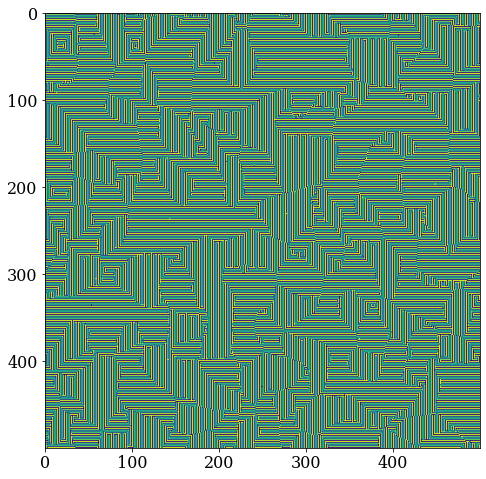

In [295]:
field, eps, idx = ising_simulation_2(field, J=-1, T=0.2)
plt.imshow(field)

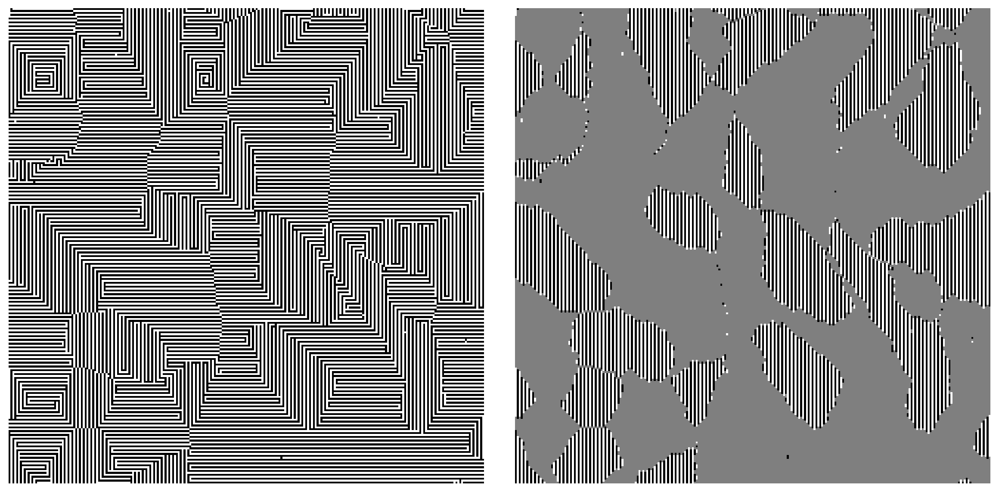

In [299]:
plt.figure(figsize=(12,6),dpi=200)
plt.subplot(121)
plt.imshow(field[:250,:250], cmap='binary')
plt.axis('off')


plt.subplot(122)
plt.imshow((field[1:]+field[:-1])[:250,:250], cmap='binary')
plt.axis('off')

plt.tight_layout()

plt.savefig("res/antidiag_res.pdf", dpi=200)

In [240]:
cell = np.array([-1, 1])
mask = np.vstack(np.hstack(cell for _ in range(250)) for _ in range(500))

/var/folders/h9/ll8t8frd1r575llt96l1glhm0000gn/T/ipykernel_20382/297641666.py:2: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  mask = np.vstack(np.hstack(cell for _ in range(250)) for _ in range(500))


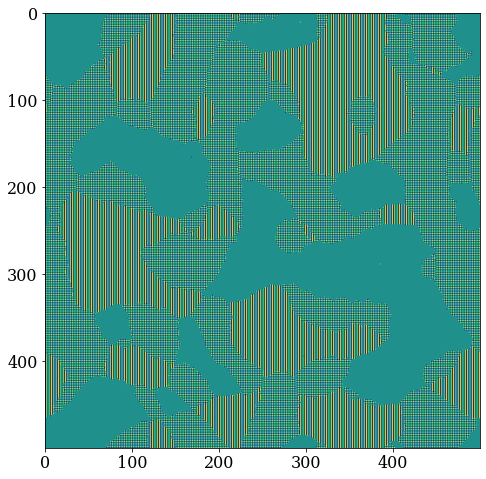

In [241]:
field, eps, idx = ising_simulation_2(field, J=-1, T=0.2)

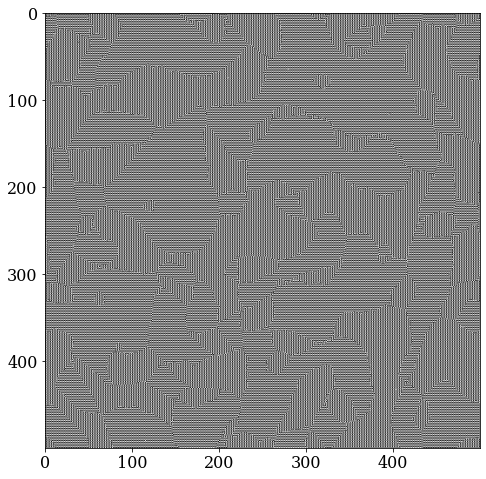

In [509]:
plt.imshow(field + mask, cmap='binary')

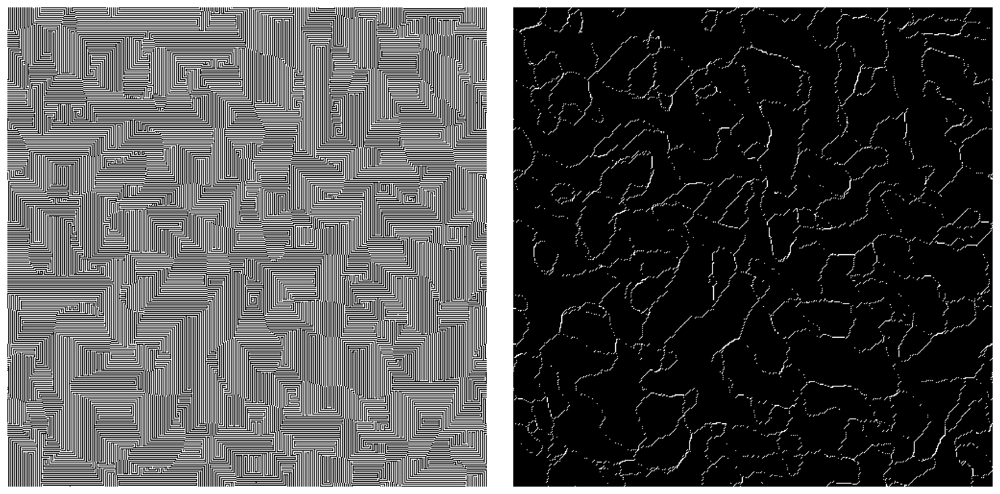

In [218]:
plt.figure(figsize=(14,7), dpi=250)
plt.subplot(121)
plt.imshow(field, cmap='binary')
plt.axis('off')

plt.subplot(122)
plt.imshow(1 - (field[1:,1:] + field[:-1,:-1])**2, cmap='binary')
plt.axis('off')

plt.tight_layout()

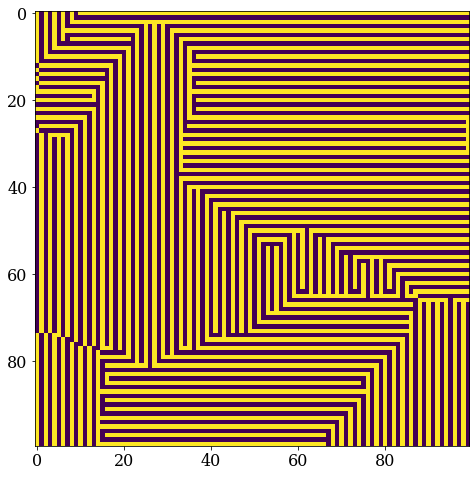

In [163]:
plt.imshow(field[n//2-50:n//2+50,n//2-50:n//2+50])

In [190]:
temperatures = np.arange(0.8, 0.00, -0.01)

for k, t in zip(range(1, len(temperatures)+1), temperatures):
    field, eps, idx = ising_simulation_2(field, J=-1, T=t)
    
    plt.figure(figsize=(14,7), dpi=250)
    plt.subplot(121)
    plt.imshow(field, cmap='binary')
    plt.axis('off')
    plt.title("Antiferromagnetic + diag, T = {}".format(round(t,2)))

    plt.subplot(122)
    plt.imshow((field[1:] + field[:-1])**2, cmap='binary')
    plt.axis('off')
    plt.title("Domains")

    plt.tight_layout()
    
    plt.savefig('anti_diag/frame{}.jpg'.format(k), dpi=250, bbox_inches='tight')
    plt.close()

In [191]:
frames = []

for k in range(1, 81):
    img = imageio.v2.imread("anti_diag/frame{}.jpg".format(k))
    frames.append(img)
    
imageio.mimsave("res/anti_diag.gif", frames, fps=10)

### Другая константа связи для диагольных соседей

In [402]:
@njit
def ising_energy_3(field, J1=1, J2=1):
    n = field.shape[0]
    
    energy = 0
    for i in range(n):
        for j in range(n):
            energy1 = -J1/4*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])
            energy2 = -J2/4*field[i, j] * (field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n])
            energy = energy1 + energy2
    return energy




@njit
def ising_simulation_3(field, J1=1, J2=1, T=0.05, maxiter=int(1e8), step=int(1e6)):
    #init
    n = field.shape[0]
    
    #to flip or not to flip
    rand_positions = np.random.randint(low=0, high=n, size=2*maxiter).reshape(-1, 2)
    rand_decision = np.random.random(maxiter)

    temp_E = ising_energy_3(field)
    #Ising steps, Monte-Carlo
    for idx in range(maxiter):
        i, j = rand_positions[idx]
        energy1 = -J1/4*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])
        energy2 = -J2/4*field[i, j] * (field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n])
        energy = energy1 + energy2
                                    

        if energy > 0 or rand_decision[idx] < np.exp(2*energy/T):
            field[i, j] = -field[i, j]
    
        if (idx+1) % step == 0:
            temp_E2 = ising_energy_3(field, J1, J2)
            delta = np.abs(temp_E2 - temp_E)
            
            if delta < 1e-3 * np.abs(temp_E):
                break
            else:
                temp_E = temp_E2
                
    return field, np.abs(delta/temp_E), idx+1

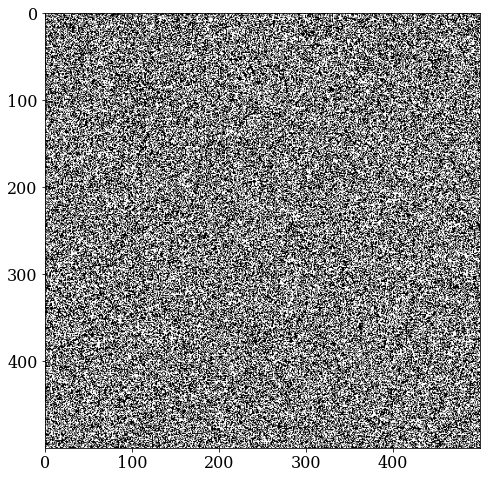

In [403]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1

plt.imshow(field, cmap='binary')

#### J1 = 0, J2=1

In [79]:
field, eps, idx = ising_simulation_3(field, J1=0, J2=1, T=0.3)
plt.imshow(field, cmap='binary')

NameError: name 'ising_simulation_3' is not defined

#### J1=-1, J2=-0.5

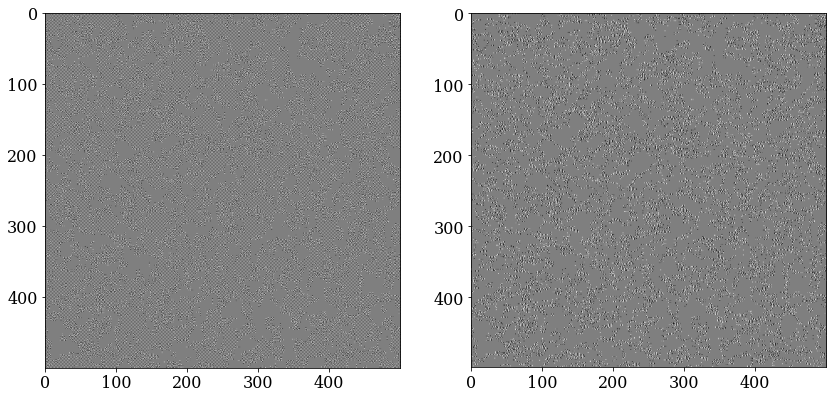

In [407]:
field, eps, idx = ising_simulation_3(field, J1=-1, J2=-0.5, T=0.05)

plt.figure(figsize=(14, 7))
plt.subplot(121)
plt.imshow((field+mask), cmap='binary')

plt.subplot(122)
plt.imshow((field[1:] + field[:-1]), cmap='binary')

### Неоднородности

К каждому узлу решётки можно добавить случайную энергию, которую можно воспринимать как присутствие примесей/дефектов в образце

In [479]:
@njit
def ising_energy_4(field, J1=1, J2=1, defects=np.zeros((500, 500))):
    n = field.shape[0]
    
    energy = 0
    for i in range(n):
        for j in range(n):
            energy1 = -J1/4*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])
            energy2 = -J2/4*field[i, j] * (field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n])
            energy = energy1 + energy2 + defects[i, j]
    return energy




@njit
def ising_simulation_4(field, J1=1, J2=1, defects=np.zeros((500,500)), T=0.05, maxiter=int(1e8), step=int(1e6)):
    #init
    n = field.shape[0]
    
    #to flip or not to flip
    rand_positions = np.random.randint(low=0, high=n, size=2*maxiter).reshape(-1, 2)
    rand_decision = np.random.random(maxiter)

    temp_E = ising_energy_4(field, J1, J2, defects)
    #Ising steps, Monte-Carlo
    for idx in range(maxiter):
        i, j = rand_positions[idx]
        energy1 = -J1/4*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])
        energy2 = -J2/4*field[i, j] * (field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n])
        energy = energy1 + energy2 + defects[i, j]
                                    

        if energy > 0 or rand_decision[idx] < np.exp(2*energy/T):
            field[i, j] = -field[i, j]
    
        if (idx+1) % step == 0:
            temp_E2 = ising_energy_4(field, J1, J2, defects)
            delta = np.abs(temp_E2 - temp_E)
            
            if delta < 1e-4 * np.abs(temp_E):
                break
            else:
                temp_E = temp_E2
                
    return field, np.abs(delta/temp_E), idx+1

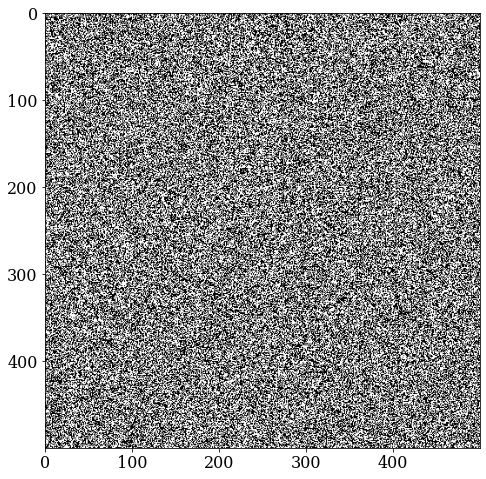

In [474]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1

plt.imshow(field, cmap='binary')

__Линейный дефект__

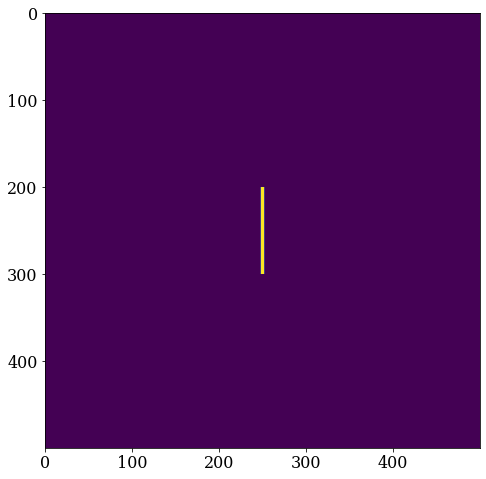

In [475]:
line = np.zeros((n, n))
line[n//2 - 50:n//2 + 50, n//2-2:n//2+2] = 1
plt.imshow(line)

In [482]:
field, eps, idx = ising_simulation_4(field, J1=1, J2=0, T=0.2, defects=1*line)

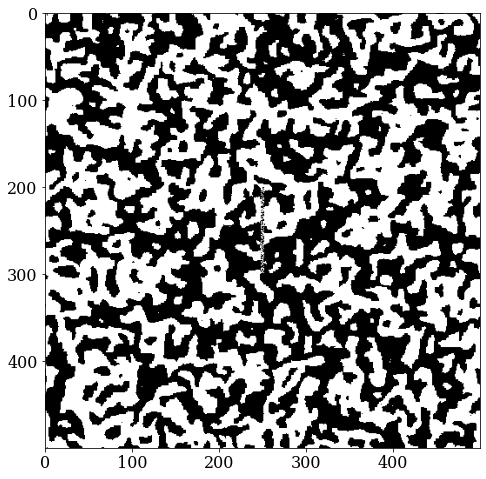

In [483]:
plt.imshow(field, cmap='binary')

__Случайные дефекты__

In [494]:
rand_def = np.random.random((n, n))

In [499]:
field, eps, idx = ising_simulation_4(field, J1=1, J2=0, T=0.3, defects=0.3*rand_def)

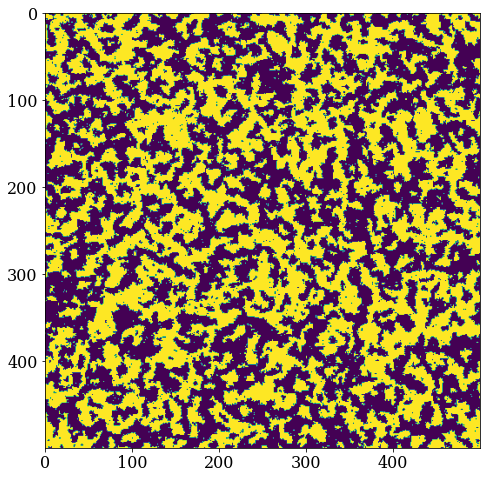

In [500]:
plt.imshow(field)

In [511]:
frames = []

for k in range(1, 81):
    img1 = imageio.v2.imread("anti/frame{}.jpg".format(k))
    img2 = imageio.v2.imread("anti_diag/frame{}.jpg".format(k))
    frames.append(np.vstack((img1[::,:3372], img2[::,:3372])))
    
imageio.mimsave("res/antiferr.gif", frames, fps=10)

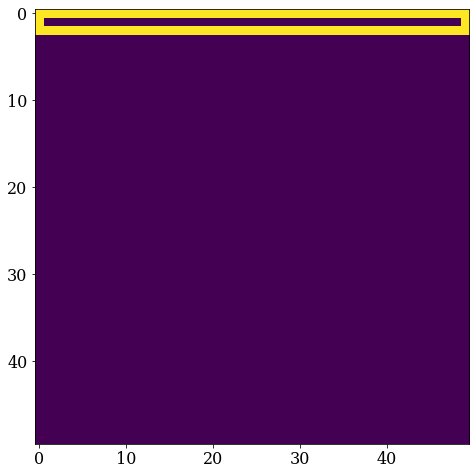

In [61]:
cell1 = np.zeros(n)
cell2 = np.ones(n)
mask1d = np.vstack((cell2, cell1, cell2))
mask1d[1,0] = 1
mask1d[1,-1] = 1
mask1d = np.vstack((mask1d, [cell1 for _ in range(n-3)]))
plt.imshow(mask1d)

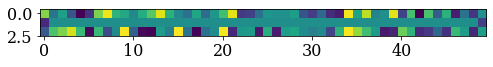

In [63]:
n = 50
field = 2*np.random.random((n, n))-1
field = field * mask1d
plt.imshow(field[:3])

In [77]:
field, eps, idx = ising_simulation(field, J=1, T=0.2)

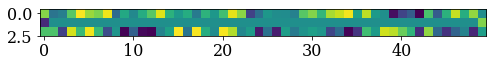

In [78]:
plt.imshow(field[:3])

### Тепловая карта для критических температур

In [259]:
temperatures = np.arange(1.0, 0.0, -0.005)
Js = np.arange(0.1, 1, 0.1)

# results = []
# print(temperatures.shape, Js.shape)

In [15]:
for j in Js:
    n = 500
    field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1
    energies = []
    for t in temperatures:
        field, eps, idx = ising_simulation(field, T=t, J=j, eps=1e-4, step=int(1e7))
        energies.append(ising_energy(field, J=j))
    results.append(energies)

SystemError: CPUDispatcher(<function ising_simulation at 0x7fc143742710>) returned a result with an exception set

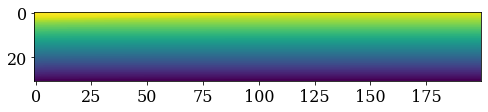

In [29]:
plt.imshow(results)

In [24]:
results = np.array(results)

In [30]:
from copy import deepcopy

In [32]:
temp = deepcopy(results)

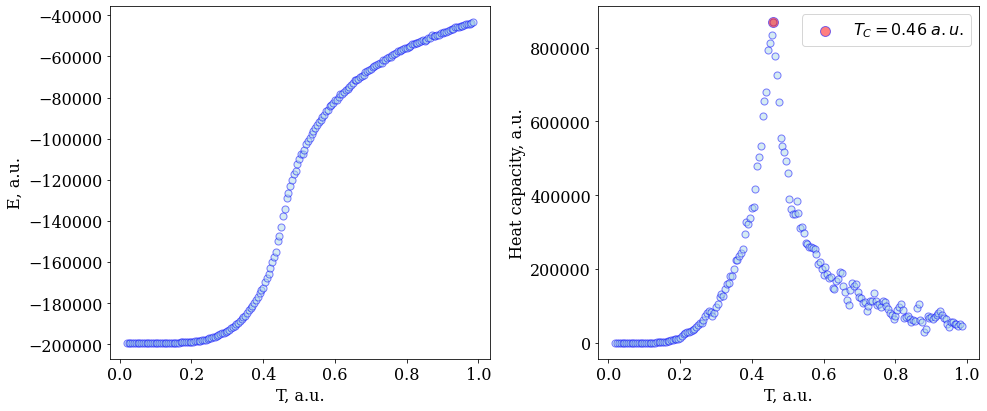

In [258]:
plt.figure(figsize=(14,6))
plt.subplot(121)
plt.scatter(np.arange(0.005, 1.001, 0.005)[3:-3], results[1][3:-3][::-1], 
            color='lightblue', edgecolors='blue', alpha=0.5, s=50)
plt.xlabel("T, a.u.")
plt.ylabel("E, a.u.")

plt.subplot(122)
plt.scatter(np.arange(0.005, 1.001, 0.005)[3:-3], 
         np.gradient(np.convolve(results[1][::-1], [1/4,1/4,1/4, 1/4], mode='same'),0.005)[3:-3],
           color='lightblue', edgecolors='blue', alpha=0.5, s=50)
plt.xlabel("T, a.u.")
plt.ylabel("Heat capacity, a.u.")

cidx = np.argmax(np.gradient(np.convolve(results[1][::-1], [1/4,1/4,1/4, 1/4], mode='same'),0.005)[3:-3])
plt.scatter(np.arange(0.005, 1.001, 0.005)[3:-3][cidx], 
         np.gradient(np.convolve(results[1][::-1], [1/4,1/4,1/4, 1/4], mode='same'),0.005)[3:-3][cidx],
           color='red', edgecolors='blue', alpha=0.5, s=100, label='$T_C = {} \\; a.u.$'.format(round(np.arange(0.005, 1.001, 0.005)[3:-3][cidx],2)))
plt.legend()
plt.tight_layout()


plt.savefig("res/heat_capacity.pdf", dpi=200)

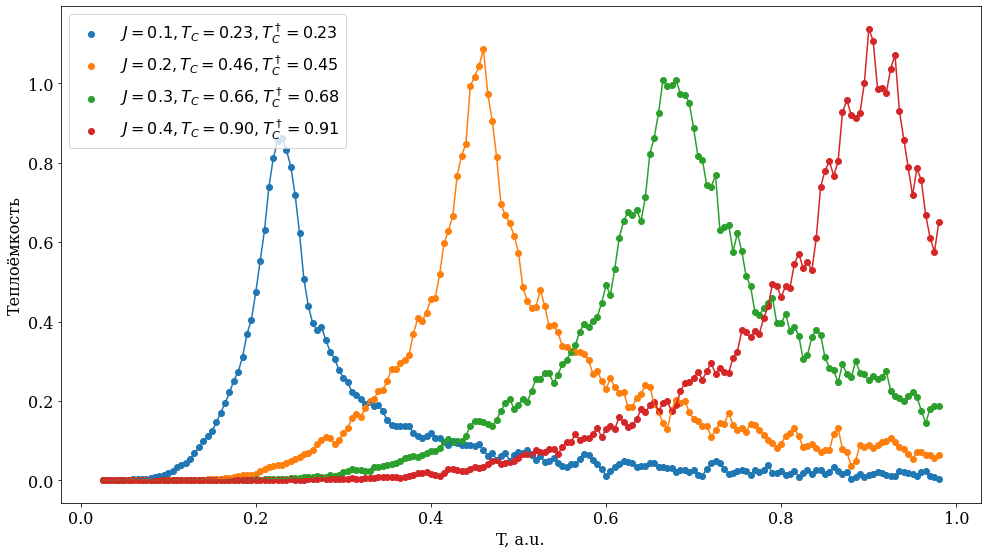

In [275]:
plt.figure(figsize=(14, 8))
for i in range(4):
    cidx = np.argmax(np.gradient(np.convolve(results[i][::-1],[1/4, 1/4, 1/4, 1/4], mode='same'), 0.005)[4:-4])
    plt.scatter(temperatures[4:-4][::-1], 
                np.gradient(np.convolve(results[i][::-1],[1/4, 1/4, 1/4, 1/4], mode='same'), 0.005)[4:-4]/8e5,
               label="$J={}, T_C={}, T_C^\dagger ={}$".format(round(Js[i],1), 
                                                            (str(round(temperatures[4:-4][::-1][cidx],2))+'0')[:4],
                                                           round(Js[i]*2.27,2)))
    plt.plot(temperatures[4:-4][::-1], 
                np.gradient(np.convolve(results[i][::-1],[1/4, 1/4, 1/4, 1/4], mode='same'), 0.005)[4:-4]/8e5)
plt.legend()

plt.xlabel("T, a.u.")
plt.ylabel("Теплоёмкость")

plt.tight_layout()
plt.savefig("res/capacities.pdf", dpi=200)

In [80]:
np.convolve(temp[0], [1/2,1/2], mode='same').shape


(200,)

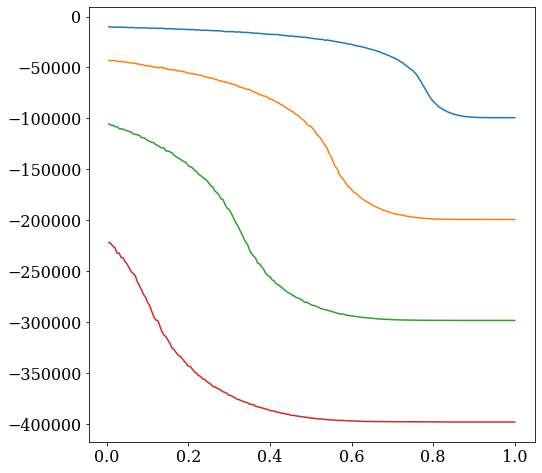

In [93]:
for i in range(4):
    plt.plot(temperatures[::-1], temp[i])

In [118]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1
energies = []
temp = np.arange(1.0, 0.0, -0.01)
for t in temp:
    field, eps, idx = ising_simulation(field, T=t, J=1, eps=5e-5, step=int(1e7))
    energies.append(ising_energy(field, J=1))

SystemError: CPUDispatcher(<function ising_simulation at 0x7fc143742710>) returned a result with an exception set

### Гистерезис

In [126]:
@njit
def ising_energy(field, J=1, H=0.0):
    n = field.shape[0]
    
    energy = 0
    for i in range(n):
        for j in range(n):
            energy += -J*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])
            energy += -H*field[i, j]
    return energy



@njit
def ising_magnetisation(field):
    return np.sum(field)/(field.shape[0]*field.shape[1])



@njit
def ising_simulation(field, J=1, H=0.0, T=0.05, maxiter=int(1e8), step=int(1e6), eps=5e-4):
    #init
    n = field.shape[0]
    
    #to flip or not to flip
    rand_positions = np.random.randint(low=0, high=n, size=2*maxiter).reshape(-1, 2)
    rand_decision = np.random.random(maxiter)

    temp_E = ising_energy(field, J, H)
    #Ising steps, Monte-Carlo
    for idx in range(maxiter):
        i, j = rand_positions[idx]
        energy = -J*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j]) - H*field[i, j]

        if energy > 0 or rand_decision[idx] < np.exp(2*energy/T):
            field[i, j] = -field[i, j]
    
        if (idx+1) % step == 0:
            temp_E2 = ising_energy(field, J, H)
            delta = np.abs(temp_E2 - temp_E)
            
            if delta < eps * np.abs(temp_E):
                break
            else:
                temp_E = temp_E2
                
    return field, np.abs(delta/temp_E), idx+1

0.016704


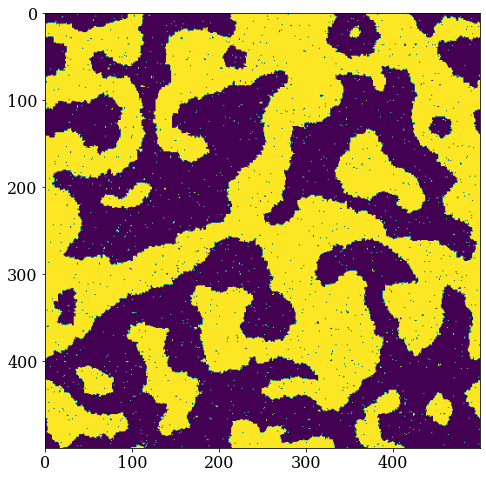

In [215]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1

field, eps, idx = ising_simulation(field, T=1.5, H=0.0, step=int(1e7))
print(ising_magnetisation(field))
plt.imshow(field)

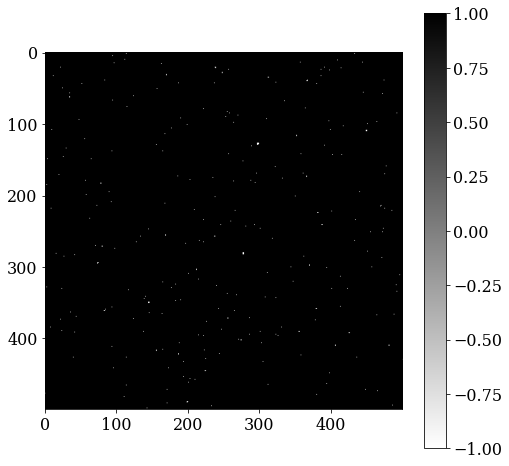

In [155]:
field, eps, idx = ising_simulation(field, H=-0.5, T=1.5)
plt.imshow(field, vmin=-1, vmax=1, cmap='binary')
plt.colorbar()

In [216]:
magnet = []
res = []
step = 0.001
H = np.hstack((np.arange(0.0, 0.01, step), np.arange(0.01, -0.02, -step), np.arange(-0.02, 0.01001, step)))

for h in H:
    field, eps, idx = ising_simulation(field, H=h, T=1.5, step=int(5e6), eps=5e-5)
    res.append(field)
    magnet.append(ising_magnetisation(field))

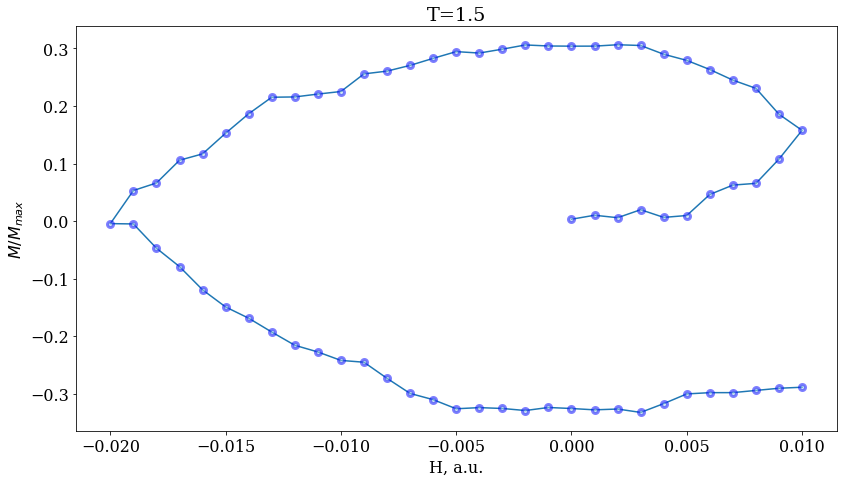

In [217]:
plt.figure(figsize=(12,7))
plt.scatter(H, magnet, color='lightblue', alpha=0.5, edgecolors='blue', linewidths=3)
plt.plot(H, magnet, zorder=-2)
plt.xlabel("H, a.u.")
plt.ylabel("$M/M_{max}$")
plt.title("T=1.5")
plt.tight_layout()

plt.savefig('res/hysteresis3.pdf', dpi=200)

In [701]:
from math import cos, sin

In [735]:
@njit
def ising_energy_3(field, J1=1, J2=1):
    n = field.shape[0]
    
    energy = 0
    for i in range(n):
        for j in range(n):
            energy1 = -J1*field[i, j]*(cos(i/20)+sin(j/20))* (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])
            energy2 = -J2*field[i, j] * (field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n])
            energy = energy1 + energy2
    return energy




@njit
def ising_simulation_3(field, J1=1, J2=1, T=0.05, maxiter=int(1e8), step=int(1e6)):
    #init
    n = field.shape[0]
    
    #to flip or not to flip
    rand_positions = np.random.randint(low=0, high=n, size=2*maxiter).reshape(-1, 2)
    rand_decision = np.random.random(maxiter)

    temp_E = ising_energy_3(field, J1, J2)
    #Ising steps, Monte-Carlo
    for idx in range(maxiter):
        i, j = rand_positions[idx]
        energy1 = -J1*field[i, j]*(cos(i/20)+sin(j/20)) * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j])
        energy2 = -J2*field[i, j]* (field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n])
        energy = energy1 + energy2
                                    

        if energy > 0 or rand_decision[idx] < np.exp(2*energy/T):
            field[i, j] = -field[i, j]
    
        if (idx+1) % step == 0:
            temp_E2 = ising_energy_3(field, J1, J2)
            delta = np.abs(temp_E2 - temp_E)
            
            if delta < 1e-3 * np.abs(temp_E):
                break
            else:
                temp_E = temp_E2
                
    return field, np.abs(delta/temp_E), idx+1

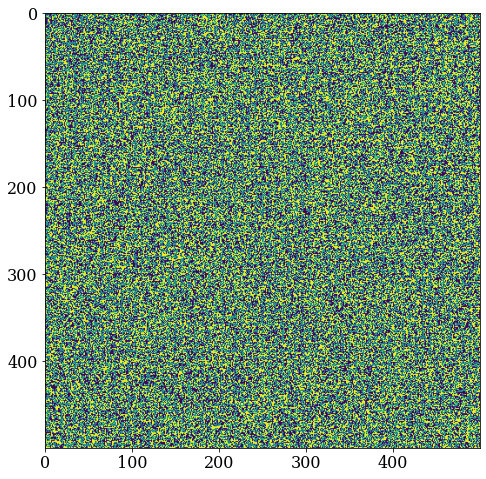

In [6]:
n = 500
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1
plt.imshow(field)

In [744]:
field, eps, idx = ising_simulation_3(field, J1=-1,J2=1, T=1)

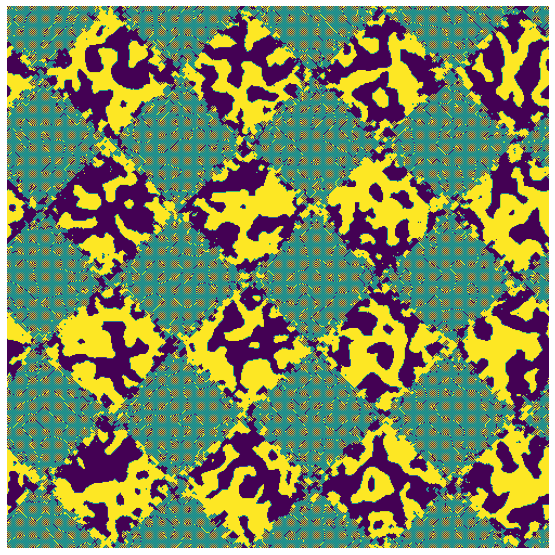

In [745]:
plt.imshow(field)
plt.axis('off')
plt.tight_layout()
# plt.savefig("res/domdom5.pdf", dpi=300, bbox_inches='tight')

In [705]:
from scipy.signal import convolve2d

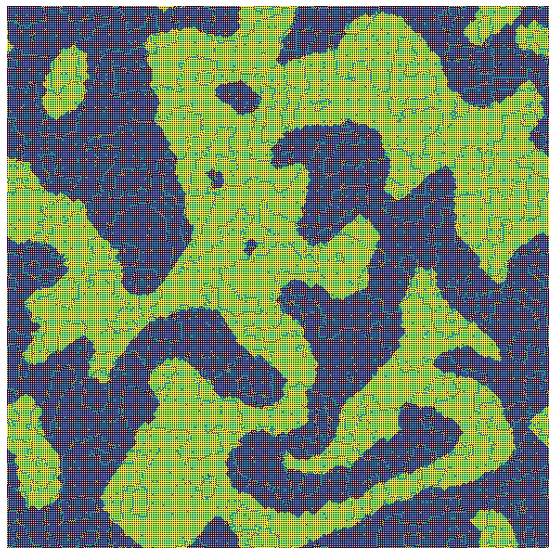

In [694]:
plt.imshow(field)
plt.axis('off')
plt.tight_layout()
plt.savefig("res/domdom.pdf", dpi=300, bbox_inches='tight')

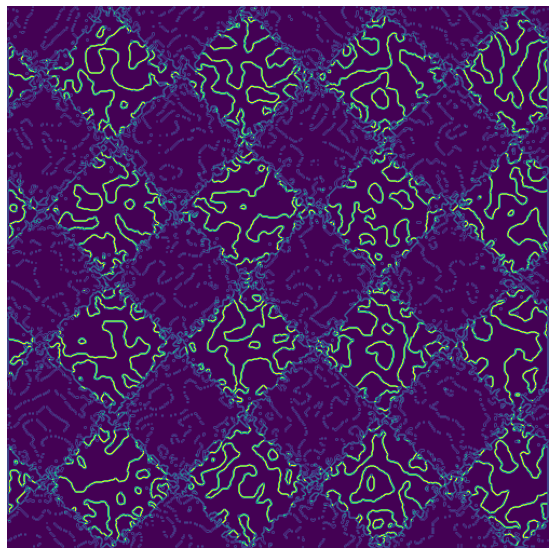

In [747]:
plt.imshow(convolve2d(field, sobel_x)**2 + convolve2d(field, sobel_y)**2)
plt.axis('off')
plt.tight_layout()
# plt.savefig("res/domdom2.pdf", dpi=300, bbox_inches='tight')

In [696]:
sobel_x

array([[-1,  0,  1],
       [-2,  0,  2],
       [-1,  0,  1]])

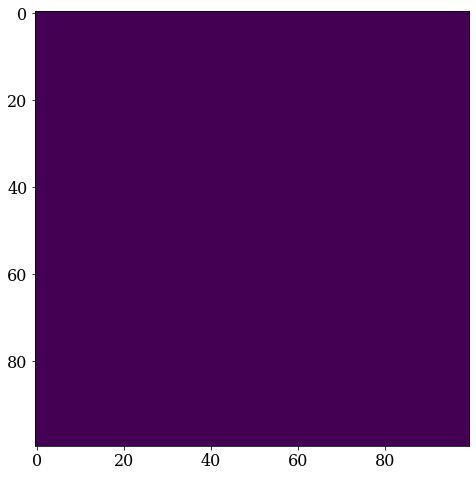

In [26]:
plt.imshow(mask[n//2-50:n//2+50, n//2-50:n//2+50])

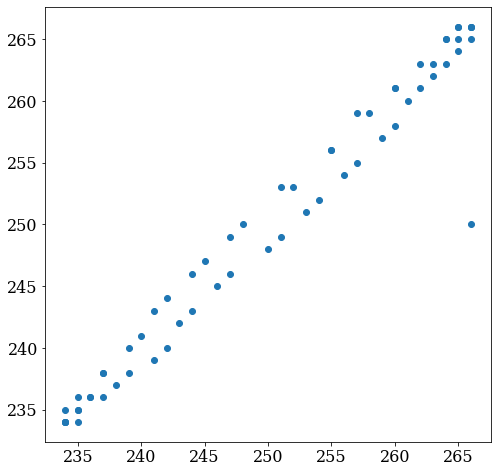

In [27]:
plt.scatter(idx.T[0], idx.T[1])

In [7]:
t = np.arange(0, 2*np.pi, 0.5)
x = np.round([n//2+8*np.cos(t)])
y = np.round([n//2+8*np.sin(t)])

idx = np.array([[xt, yt] for xt, yt in zip(x, y)], dtype='int')
mask = np.ones((n, n))
for i, j in idx:
    mask[i, j] = 0
    
t = np.arange(0, 2*np.pi, 0.4)
x = np.round([n//2+10*np.cos(t)])
y = np.round([n//2+10*np.sin(t)])

idx = np.array([[xt, yt] for xt, yt in zip(x, y)], dtype='int')
for i, j in idx:
    mask[i, j] = 0
    

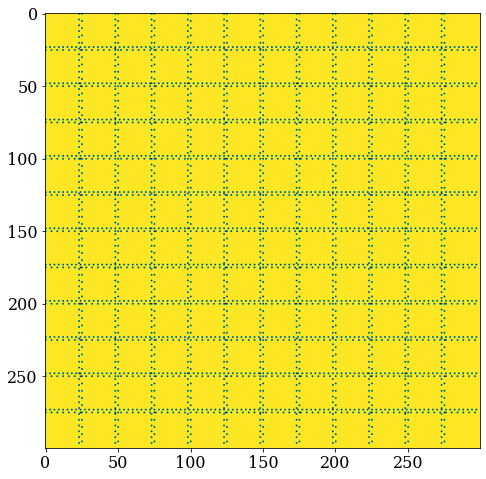

In [449]:
line = np.ones((n,n))

d = 25
for k in range(-5, 6):
    line[n//2-d*k, ::4] = 0
    line[n//2-d*k-2, ::3] = 0
    line[::5,n//2-d*k] = 0
    line[::4,n//2-d*k-2] = 0

plt.imshow(line)

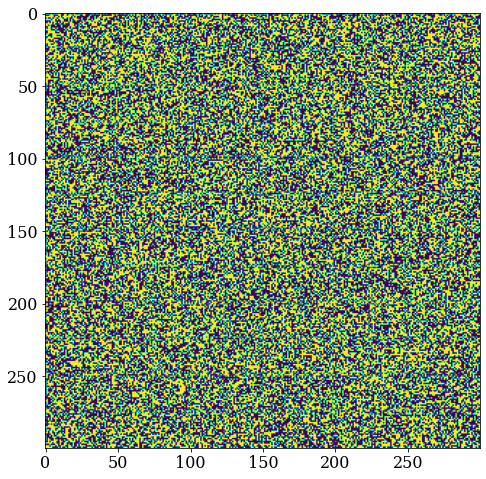

In [460]:
n = 300
field = 2 * np.random.randint(low=0, high=2, size=(n,n)) - 1
field = field * line
plt.imshow(field)

In [119]:
from copy import deepcopy
field_stable = deepcopy(field)

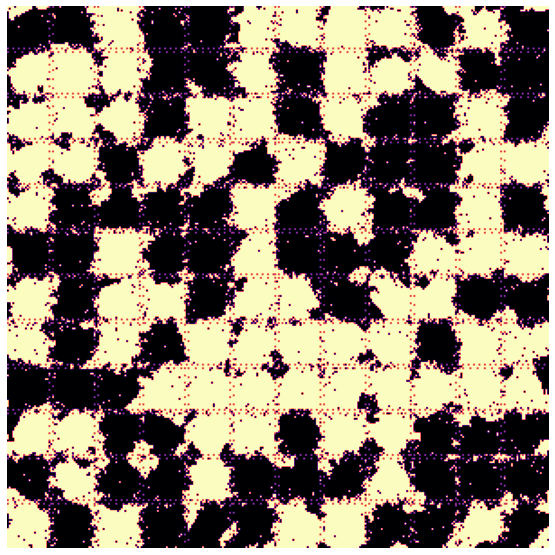

In [431]:
plt.imshow(field, cmap='magma')
plt.axis('off')

plt.tight_layout()
plt.savefig("res/pinning2.jpg", bbox_inches='tight', facecolor='black', edgecolor='white')

In [441]:
a = np.array([1,2,3,4,15,2,1,2, 1])
np.unique(a)

array([ 1,  2,  3,  4, 15])

### Магнитная память

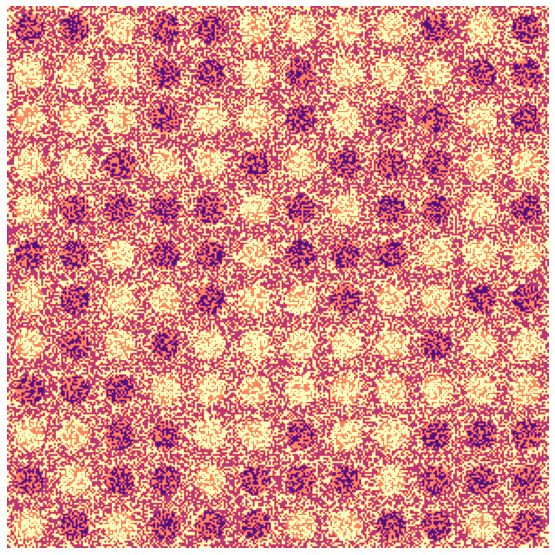

In [428]:
from itertools import product
center_idx = np.array([n//24 + n//12 * k for k in range(12)])
center_idx = np.array([p for p in product(center_idx, center_idx)], dtype='int')



def box(x, y, s):
    return np.exp(-((x**2+y**2)/(2*s))**10)

centers = np.array(np.random.randint(size=5, low=0, high=len(center_idx)), dtype='int')
signs = 2*np.random.randint(size=center_idx.shape[0], low=0, high=2)-1


x = np.arange(0,n,1)
xv, yv = np.meshgrid(x, x)


hfield = np.zeros((n,n))

for c, s in zip(range(len(center_idx)), signs):
    pos_x, pos_y = center_idx[c]
    hfield += s*box(xv-pos_x,yv-pos_y,35)
    

plt.imshow(line+hfield+field, vmin=-2, vmax=2, cmap='magma')
plt.axis('off')
plt.tight_layout()

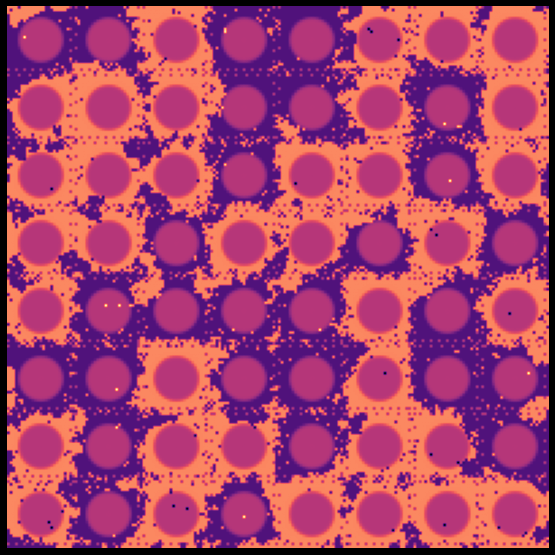

In [430]:
field, eps, idx = ising_simulation_mem(field, T=1, J=1, H=hfield, maxiter=int(1e6))

plt.figure(facecolor='black')
plt.imshow((field+hfield)[:200,:200], vmin=-2, vmax=2, cmap='magma')
plt.axis('off')
plt.tight_layout()

In [461]:
for i in range(100):
    field, eps, idx = ising_simulation_2(field, T=1, J=1, maxiter=int(1e6))
    
    plt.figure(facecolor='black')
    plt.imshow(field[:200,:200], 
               cmap='magma', vmin=-2, vmax=2)
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig("memory/unstable{}.jpg".format(i+1),
                bbox_inches='tight', 
                facecolor='black', 
                edgecolor='white')
    plt.close()

In [462]:
for j in range(5):
    #field initialization
    signs = 2*np.random.randint(size=10, low=0, high=2)-1
    centers = np.unique(np.array(np.random.randint(low=0, high=96, size=10), dtype='int'))
    hfield = np.zeros((n,n))
    
    for c, s in zip(centers, signs):
        pos_x, pos_y = center_idx[c]
        hfield += 1*s*box(xv-pos_x,yv-pos_y,40)
        
        
    #simulation
    for i in range(100):
        field, eps, idx = ising_simulation_mem(field, H=0.5*hfield, T=1, J=1, maxiter=int(2e5))
        plt.figure(facecolor='black')
        plt.imshow((field+hfield)[:200,:200], vmin=-2, vmax=2, 
                   cmap='magma')
        plt.axis('off')

        plt.tight_layout()
        plt.savefig("memory/stable{}.jpg".format(j*100 +i+1),
                    bbox_inches='tight', 
                    facecolor='black', 
                    edgecolor='white')
        plt.close()

In [463]:
frames = []

for i in range(100):
    img = imageio.v2.imread("memory/unstable{}.jpg".format(i+1))
    frames.append(img)
    
for i in range(500):
    img = imageio.v2.imread("memory/stable{}.jpg".format(i+1))
    frames.append(img)

In [464]:
imageio.mimsave('res/memory2.gif', frames, fps=20)

In [303]:
field = deepcopy(field_stable)
field, eps, idx = ising_simulation_mem(field, H=0.5*hfield, T=1, J=1, maxiter=int(10e6))

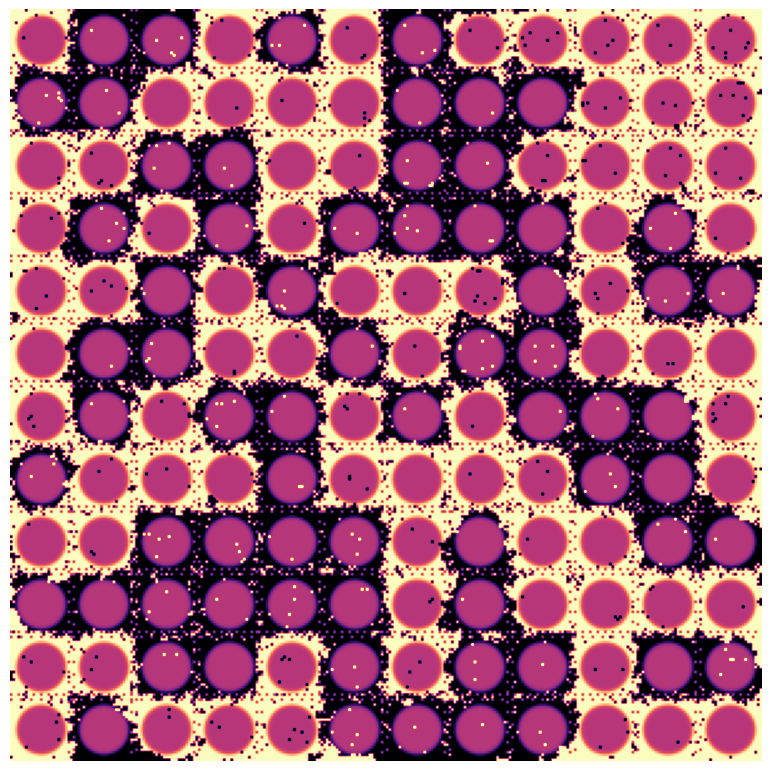

In [304]:
plt.figure(dpi=100, facecolor='white')
plt.imshow(field-hfield, vmin=-1, vmax=1, cmap='magma')
plt.axis('off')
plt.tight_layout()

In [229]:
@njit
def ising_energy_mem(field, H, J=1):
    n = field.shape[0]
    
    energy = 0
    for i in range(n):
        for j in range(n):
            energy += -J/4*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j] +
                                    field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n]) - H[i,j] * field[i,j]
    return energy




@njit
def ising_simulation_mem(field, H, J=1, T=0.05, maxiter=int(1e8), step=int(1e6)):
    #init
    n = field.shape[0]
    
    #to flip or not to flip
    rand_positions = np.random.randint(low=0, high=n, size=2*maxiter).reshape(-1, 2)
    rand_decision = np.random.random(maxiter)

    temp_E = ising_energy_2(field, J)
    #Ising steps, Monte-Carlo
    for idx in range(maxiter):
        i, j = rand_positions[idx]
        energy = -J/4*field[i, j] * (field[i, (j+1)%n] + field[i, (j-1)%n] + field[(i+1)%n,j] + field[(i-1)%n,j] +
                                    field[(i+1)%n, (j+1)%n] + field[(i-1)%n, (j+1)%n] + field[(i+1)%n, (j-1)%n] +
                                    +field[(i-1)%n, (j-1)%n]) - H[i,j] * field[i,j]

        if energy > 0 or rand_decision[idx] < np.exp(2*energy/T):
            field[i, j] = -field[i, j]
    
        if (idx+1) % step == 0:
            temp_E2 = ising_energy_2(field, J)
            delta = np.abs(temp_E2 - temp_E)
            
            if delta < 1e-4 * np.abs(temp_E):
                break
            else:
                temp_E = temp_E2
                
    return field, np.abs(delta/temp_E), idx+1

In [ ]:
ising_simulation_mem(field, )